# Определение жанра по изображению обложки музыкального диска

*Описание задачи:*
- Необходимо разработать модель, которая определит жанр музыкального альбома по изображению его обложки.

*Данные:*
- Изображения в формате PNG, упакованные в zip-архивы. Имя архива соответствует музыкальному жанру. Каждый zip-архив содержит папку с изображениями музыкальных обложек соответствующего жанра.

*План работ:*
- Загрузка датасета с картинками
- Анализ изображений
- Создание baseline
- Улучшение baseline
- Исследование результатов лучшей модели


# 1. Загрузка данных

In [1]:
import os
import shutil
import cv2
import numpy as np
import pandas as pd
import random
import time

import optuna
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A

from PIL import Image
from random import randint
from tqdm import tqdm

from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (f1_score, accuracy_score,
                             confusion_matrix, classification_report)
from catboost import CatBoostClassifier

import torch
import torch.nn as nn
import torch.optim as optim
# import torch_directml
from torch.utils.data import (DataLoader, random_split, 
                              Dataset, WeightedRandomSampler)

import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torchvision.models as models
from torchvision.models import ResNet50_Weights


In [2]:
# расположение папок с изображениями
main_path = 'data/'

RANDOM = 12345

In [3]:
# просмотр всех категорий папок в каталоге
content_file = os.listdir(main_path)
print(content_file)
print(F'\nКол-во категорий: {len(content_file)}')

['anime', 'reggae', 'jazz', 'classical', 'rap', 'black metal', 'edm', 'country', 'pop', 'disco']

Кол-во категорий: 10


In [4]:
# создадим датасет для записи информации
columns = ['name_image', 'category', 'path_to_image', ]
data = pd.DataFrame(columns = columns)

for i in content_file:
    #вытаскиваем фалй из каждой папки
    content_folder = os.listdir(main_path + i)
    
    #сохраняем название картинок в датасет
    data_l = pd.DataFrame(content_folder, columns = ['name_image'])
    #сохраняем категорию картинок
    data_l['category'] = i
    #сохраняем путь до картинки
    data_l['path_to_image'] = [main_path+i+'/'+x for x in data_l['name_image']]
    
    #объеденям датасеты
    data = pd.concat([data, data_l], axis = 0, ignore_index = True)
    
    #очищаем память
    del data_l

In [5]:
data.head()

,name_image,category,path_to_image
0,c5ca67d4-3796-488c-9d44-17bdd49f9bc7.png,anime,data/anime/c5ca67d4-3796-488c-9d44-17bdd49f9bc...
1,badf5ae2-8f3f-485a-9edb-5b3df4f0def1.png,anime,data/anime/badf5ae2-8f3f-485a-9edb-5b3df4f0def...
2,3404b95c-d44a-4fc0-a340-b422a028543c.png,anime,data/anime/3404b95c-d44a-4fc0-a340-b422a028543...
3,5f11db13-2bdd-47bf-bc2f-bcbd1eb40e35.png,anime,data/anime/5f11db13-2bdd-47bf-bc2f-bcbd1eb40e3...
4,7c13a19e-029d-44d1-b804-4cd846d221b8.png,anime,data/anime/7c13a19e-029d-44d1-b804-4cd846d221b...


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7800 entries, 0 to 7799
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   name_image     7800 non-null   object
 1   category       7800 non-null   object
 2   path_to_image  7800 non-null   object
dtypes: object(3)
memory usage: 182.9+ KB


<div style="background-color: lightgreen; padding: 10px;">
Вывод: были згружены дыннае картинок из папки data в датасте. Всего у нас 7800 картинок.
</div>

# 2. Исследование и предобработка данных

In [7]:
# просмотр количества фотографий в каждой категории
data.groupby('category')['category'].count().sort_values(ascending = False)

category
country        1486
anime          1189
classical       955
jazz            821
pop             803
edm             719
reggae          581
disco           468
black metal     450
rap             328
Name: category, dtype: int64

<span style="color: blue;">Есть дисбаланс в кол-ве категорий.</span>

In [8]:
category_all = content_file.copy()

In [9]:
def scroll_image(category, dataset):
    '''Функция для просмотра 4 изображений выбранной категории их датасета'''
    
    fig = plt.figure(figsize=(12, 12))
    
#   выбор случайных фотографий 
    r_list = [randint(dataset[dataset['category'] == category].index[0], dataset[dataset['category'] == category].index[-1]) for x in range(8)]
    scroll = 0

#     прорисовка фото
    for x in r_list:
        if os.path.isfile(dataset['path_to_image'][x]):
            fig.add_subplot(4, 4, scroll+1)
            image = Image.open(data['path_to_image'][x])
            plt.imshow(image)  
            plt.title(category)

            scroll += 1


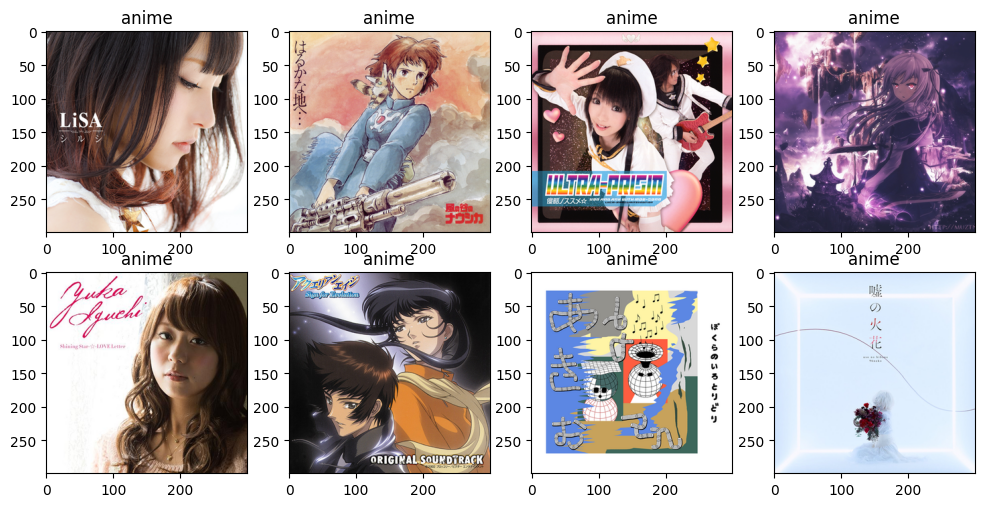

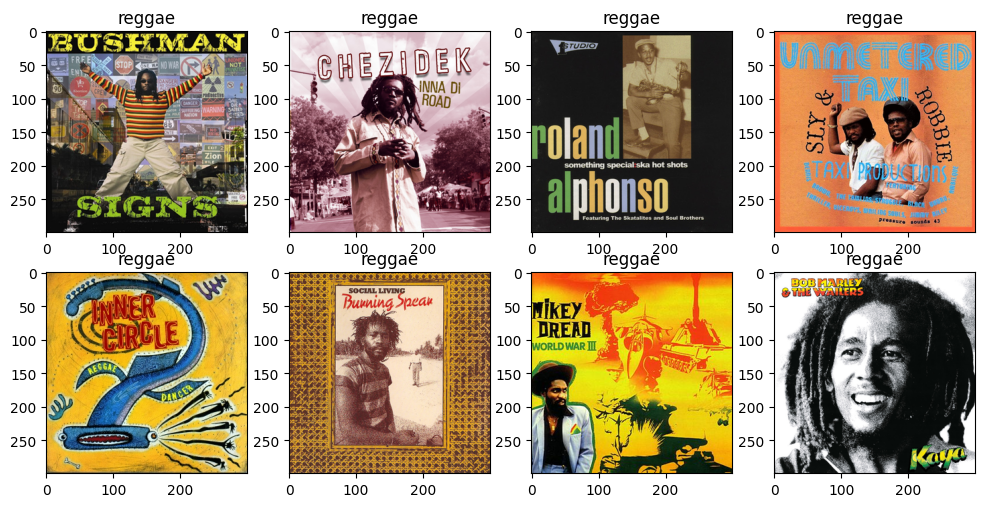

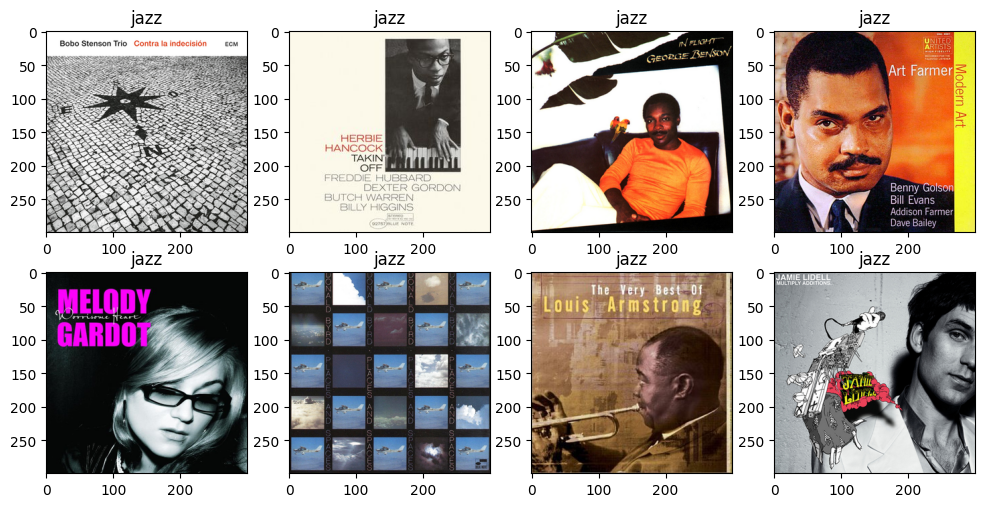

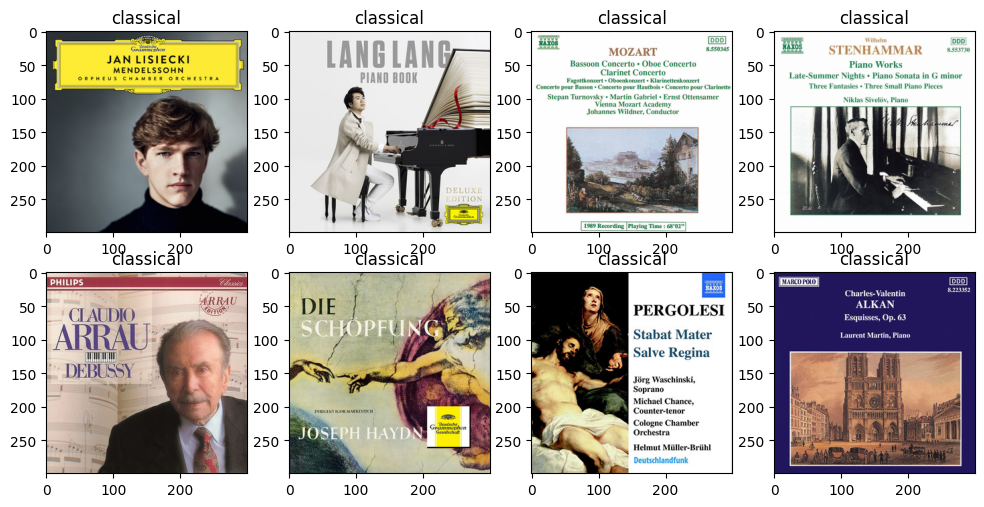

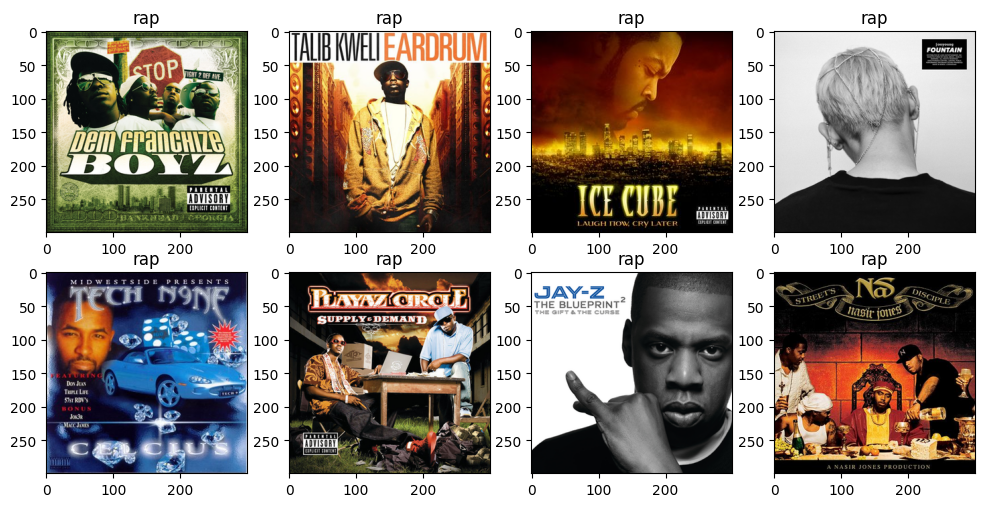

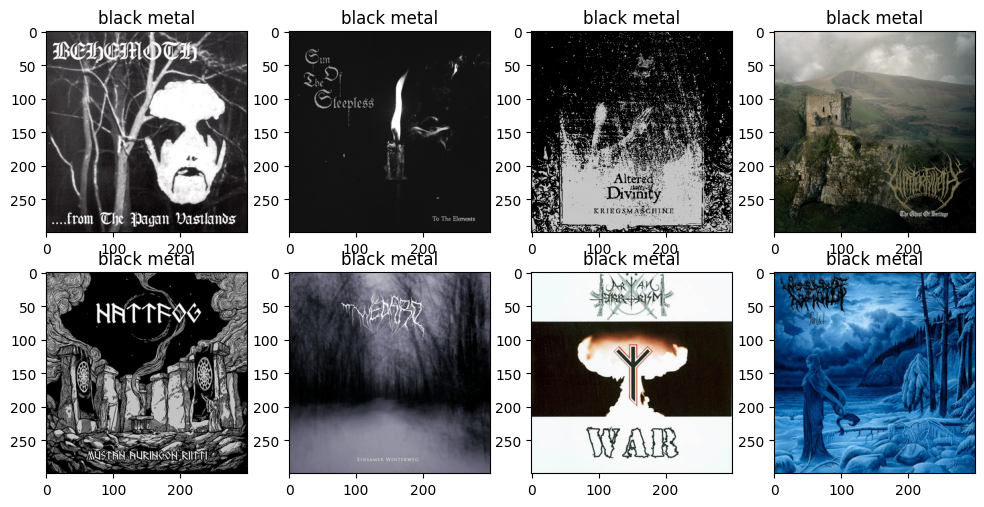

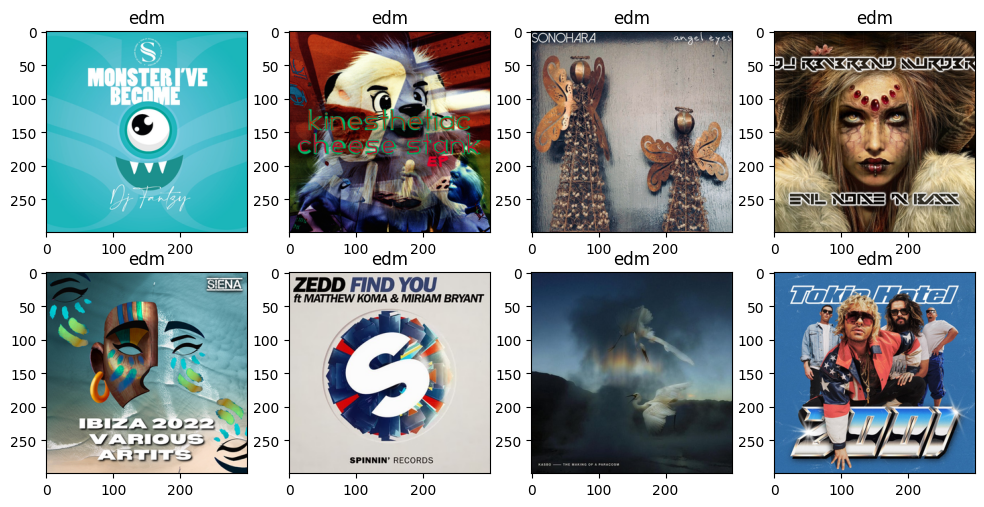

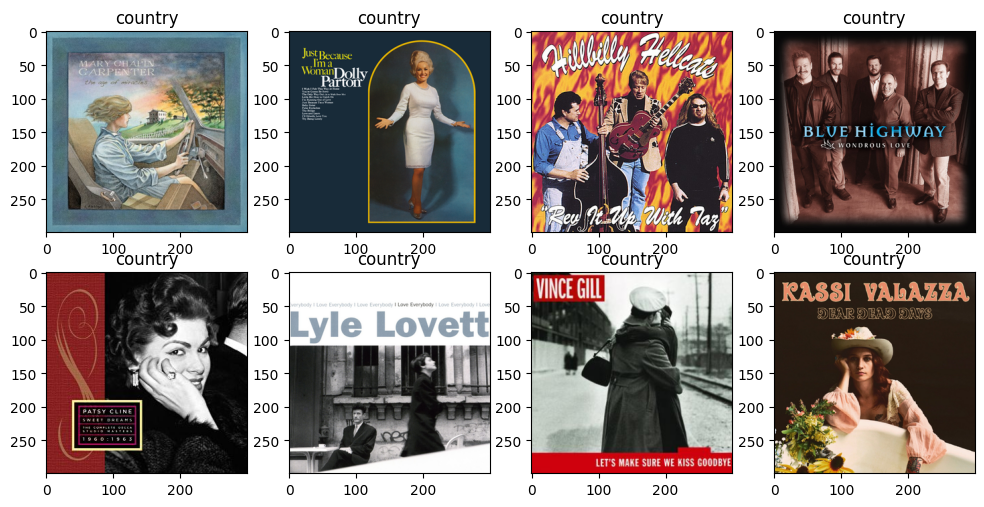

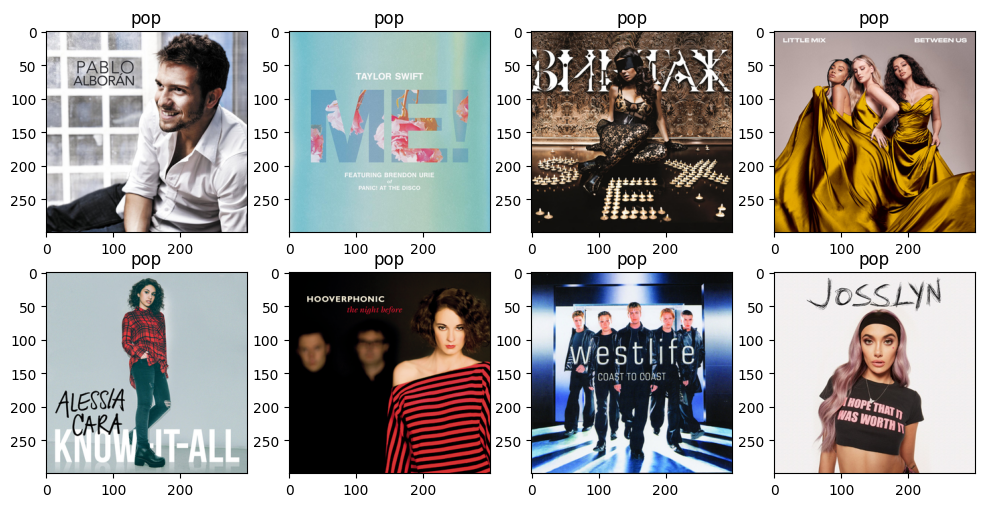

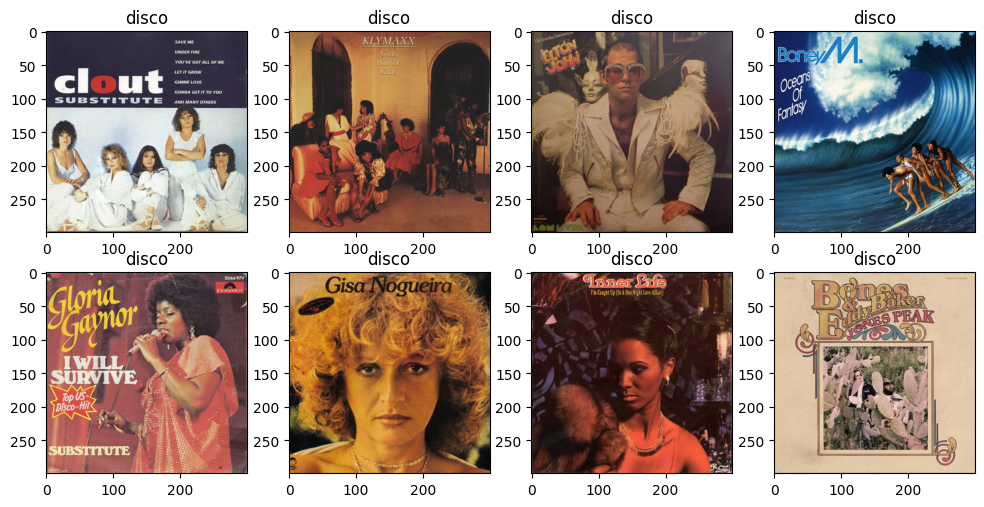

In [10]:
# реализация функции выше и просмотр картинок из датасета
for i in category_all:
    try:
        scroll_image(i, data)
    except Exception as e:
        print('Возникла ошибка', e)
        pass

<span style="color: blue;"> Код ниже используется для изучения размерности изображений, но т.к. нам уже известно что все фотографии имеют размерность 300*300 он закомичен для экономии времени исполнения.</span>

In [11]:
# проверим размерность фотографий, правда ли они одинаковые везде
def return_x_y(path_to_image):
    '''Функция для просмотра формата изображений'''
    try:
        image = Image.open(path_to_image)
        return [np.array(image).shape[0], np.array(image).shape[1]]
    except:
        return (300, 300)

In [12]:
# %%time
# data['xy_shape'] = data['path_to_image'].apply(return_x_y)

In [13]:
# data['x_shape'] = data['xy_shape'].apply(lambda x: x[0])
# data['y_shape'] = data['xy_shape'].apply(lambda x: x[1])

In [14]:
# data['x_shape'].describe()

<span style="color: blue;"> Формат картинок везде одинаковый, аномальных изображений нет.</span>

In [15]:
# data = data.drop(['x_shape', 'y_shape', 'xy_shape'], axis = 1)

<font color="red"> <font size=5> Функции не работаю, передалать перед отправкой </font> </font>

In [16]:
def show_color_image(category):
    '''Функция для просмотра RGB палитры выбрнного жанра'''
    plt.figure(figsize=(8, 8))
    all_pixels = []
    
    # Проходимся по всем файлам изображений
    for image_file in data[data['category'] == category]['path_to_image']:
        try:
            # Считываем изображение
            image = cv2.imread(image_file)

            # Преобразуем из BGR в RGB
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Добавляем пиксели изображения в массив
            all_pixels.extend(image_rgb.reshape(-1, 3))
        except:
            print('Ошибка. Картинка не открывается ', image_file)

    # Преобразуем список пикселей в массив NumPy
    all_pixels = np.array(all_pixels)

    #  Построение гистограммы цветов
    plt.hist(all_pixels, bins=20, color=['red', 'green', 'blue'], alpha=0.7, label=['Red', 'Green', 'Blue'])
    plt.xlabel('Intensity')
    plt.ylabel('Count')
    plt.title(f'Интенсивность цветов по пикселям у категории {category}')
    plt.legend()
    plt.show()

<span style="color: blue;"> Данный код достаточно ресурсоёмкий, поэтому постоянный его запуск тратит много ресурсов</span>

In [17]:
# %%time
# for i in category_all:
#     show_color_image(i)

<span style="color: blue;"> Некоторые цветовые гаммы жанров очень похожи, в будущем возможно эти категории будут хуже предсказываться моделью.</span>

In [18]:
# анализ качества изображения
def grad_image_mean(category):
    '''Функция оценки качества изображения на основании градиента серого цвета'''
    
    mean_gradients = []
    
    # Проходимся по всем файлам изображений
    for image_file in data[data['category'] == category]['path_to_image']:
        try:
            # Считываем изображение
            image = cv2.imread(image_file, cv2.IMREAD_COLOR)

            # Преобразуем изображение в оттенки серого
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Вычисляем градиент
            grad_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
            magnitude = np.sqrt(grad_x**2 + grad_y**2)

            # Среднее значение градиента
            mean_gradient = np.mean(magnitude)

            # Добавляем среднее значение градиента в массив
            mean_gradients.append(mean_gradient)
        except:
            print('Ошибка. Картинка не открывается ', image_file)
            
    # Среднее значение градиента по всем изображениям
    overall_mean_gradient = np.mean(mean_gradients)
    print(f"Overall Mean Gradient category {category}: {overall_mean_gradient}")

In [19]:
%%time
for i in category_all:
    grad_image_mean(i)
    print()

Overall Mean Gradient category anime: 89.61123567102584

Overall Mean Gradient category reggae: 102.57901227360112

Overall Mean Gradient category jazz: 75.35060242017195

Ошибка. Картинка не открывается  data/classical/1a4a29f5-5242-461a-8269-fe7b9914f7c3.png
Ошибка. Картинка не открывается  data/classical/f6135239-aad2-4a03-80c5-b8bebc5d990b.png
Overall Mean Gradient category classical: 82.78715553495428

Overall Mean Gradient category rap: 102.9847457002868

Overall Mean Gradient category black metal: 88.44880783722002

Overall Mean Gradient category edm: 81.74122966680858

Overall Mean Gradient category country: 84.39346186797118

Overall Mean Gradient category pop: 74.5732989309972

Ошибка. Картинка не открывается  data/disco/c69fb1bf-7df3-4551-8bcf-a933ea78acb2.png
Overall Mean Gradient category disco: 76.8209266352969

CPU times: user 20.4 s, sys: 961 ms, total: 21.4 s
Wall time: 21.3 s


<div style="background-color: lightgreen; padding: 10px;">
Вывод: было проведено исследования картинок из представленного датасета. Аномалий среди них оюнаружено не было. Выявлен явный дисбаланс классов, и цветовое сходство некоторых категорий.
</div>

# 3.Подготовка дадасетов

<span style="color: blue;"> Сформируем дадасет для baseline моделей, и создадим папки с изображениями для нейросети CV</span>

In [20]:
# Для начала поделим данные
train, test = train_test_split(data, test_size = 0.15, shuffle = True, random_state = RANDOM)

In [21]:
train.shape, test.shape

((6630, 3), (1170, 3))

In [22]:
# векторизуем картинки и создадим новый датасет

In [23]:
def create_vector_image(data, AMD_GPU = False):

    """Функция векторизирует изображения, и возвращает список
    векторов и название картинки, которая была трансформирована"""
    
    if AMD_GPU:
        device = torch_directml.device()
    else:
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('Векторизация с использованием ', device)

    # Загрузка предварительно обученной модели ResNet-18
    resnet50 = models.resnet50(weights = ResNet50_Weights.IMAGENET1K_V2)

    # Заморозка весов
    for param in resnet50.parameters():
        param.requires_grad_(False)

    # Исключение полносвязных слоев модели и создание сети
    resnet50 = nn.Sequential(*list(resnet50.children())[:-1])

    resnet50.eval().to(device)

    # форматирование изображения
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # цикл по трансформации кадой фотографии
    array_img = []
    category = []
    for i in tqdm(data.index):
        image = Image.open(data['path_to_image'][i]).convert('RGB')
        image = transform(image).unsqueeze(0).to(device)

        output = resnet50(image).to(device).flatten()

        output_cpu = output.to('cpu')
        image_vec = output_cpu.squeeze().numpy()

        array_img.append(image_vec)
        category.append(data['category'][i])

    return array_img, category

In [24]:
# image_vector, image_categ = create_vector_image(train, True)
image_vector, image_categ = create_vector_image(train, False)

Векторизация с использованием  cpu


100%|█████████████████████████████████████████████████████████████████████| 6630/6630 [03:46<00:00, 29.21it/s]


In [25]:
train_image_vector = pd.DataFrame(data = image_vector)
train_image_vector['category'] = image_categ

In [26]:
train_image_vector.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,category
0,0.003932,0.005557,0.000000,0.000000,0.297699,0.000000,0.132915,0.326882,0.328791,0.0,...,0.000000,0.155918,0.081491,0.0,0.038248,0.307179,0.181009,0.000000,0.302379,reggae
1,0.000000,0.083270,0.059653,0.000000,0.654183,0.000000,0.004875,0.000000,0.007578,0.0,...,0.000000,0.001024,0.000000,0.0,0.995091,0.000000,0.002337,0.000931,0.279712,edm
2,0.000000,0.016056,0.000000,0.060055,4.464208,0.000000,0.000000,1.777187,0.000000,0.0,...,0.015427,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.208367,edm
3,0.184438,0.055976,0.229959,0.000000,1.783604,0.069165,0.000000,3.061295,0.153534,0.0,...,0.173462,0.000000,0.004957,0.0,0.049062,0.249417,0.000000,0.000000,0.000000,anime
4,0.022301,0.008033,0.023490,0.000000,1.868481,0.000000,0.016662,0.765618,0.000000,0.0,...,0.000000,0.079445,0.034209,0.0,0.000000,0.107702,0.000000,0.000000,0.000000,reggae


In [27]:
def rename_columns(data, new_prefics, key = 'x'):
    """Функция для переименования столбцов"""
    if key != 'x':
        col = []
        for i in data.columns[:-1]:
            col.append(str(i)+new_prefics)
        col.append(key)

        data.columns = col

        return data
    else:
        col = []
        for i in data.columns:
            col.append(str(i)+new_prefics)
        data.columns = col

        return data

In [28]:
train_image_vector = rename_columns(train_image_vector, '_i', key = 'category')

In [29]:
train_image_vector.head()

,0_i,1_i,2_i,3_i,4_i,5_i,6_i,7_i,8_i,9_i,...,2039_i,2040_i,2041_i,2042_i,2043_i,2044_i,2045_i,2046_i,2047_i,category
0,0.003932,0.005557,0.000000,0.000000,0.297699,0.000000,0.132915,0.326882,0.328791,0.0,...,0.000000,0.155918,0.081491,0.0,0.038248,0.307179,0.181009,0.000000,0.302379,reggae
1,0.000000,0.083270,0.059653,0.000000,0.654183,0.000000,0.004875,0.000000,0.007578,0.0,...,0.000000,0.001024,0.000000,0.0,0.995091,0.000000,0.002337,0.000931,0.279712,edm
2,0.000000,0.016056,0.000000,0.060055,4.464208,0.000000,0.000000,1.777187,0.000000,0.0,...,0.015427,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.208367,edm
3,0.184438,0.055976,0.229959,0.000000,1.783604,0.069165,0.000000,3.061295,0.153534,0.0,...,0.173462,0.000000,0.004957,0.0,0.049062,0.249417,0.000000,0.000000,0.000000,anime
4,0.022301,0.008033,0.023490,0.000000,1.868481,0.000000,0.016662,0.765618,0.000000,0.0,...,0.000000,0.079445,0.034209,0.0,0.000000,0.107702,0.000000,0.000000,0.000000,reggae


In [30]:
# image_vector, image_categ = create_vector_image(test, True)
image_vector, image_categ = create_vector_image(test, False)

Векторизация с использованием  cpu


100%|█████████████████████████████████████████████████████████████████████| 1170/1170 [00:41<00:00, 28.42it/s]


In [31]:
test_image_vector = pd.DataFrame(data = image_vector)
test_image_vector['category'] = image_categ

In [32]:
test_image_vector.head()

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,category
0,0.000000,0.019124,0.000000,0.000000,0.787765,0.044309,0.017522,5.157182,0.000000,0.313312,...,0.000000,0.041371,0.107506,0.000000,0.199363,0.449660,0.000000,0.0,0.000330,pop
1,0.046987,0.009820,0.014566,0.020168,1.235301,0.361289,0.000000,0.026476,0.315014,0.017394,...,0.233275,0.000000,0.126403,0.013739,0.077038,0.195807,0.105725,0.0,0.384083,pop
2,0.095677,0.000000,0.000000,0.000000,2.285575,0.000000,0.127231,0.566642,0.058171,0.038742,...,0.000000,0.030370,1.157704,0.000000,0.026053,1.918655,0.375835,0.0,0.000000,pop
3,0.000000,0.028346,0.012055,0.970285,0.424891,0.008621,0.005937,0.105153,0.000000,0.391674,...,0.000000,0.030481,0.004376,0.011567,0.000000,0.011628,0.000000,0.0,0.003507,jazz
4,0.011984,0.217154,0.019979,0.000000,1.077066,0.000000,0.000000,0.000000,0.181689,0.000000,...,0.000000,0.011437,0.075382,0.000000,0.033865,0.000000,0.100373,0.0,0.000000,jazz


In [33]:
test_image_vector = rename_columns(test_image_vector, '_i', key = 'category')

In [34]:
test_image_vector.head()

,0_i,1_i,2_i,3_i,4_i,5_i,6_i,7_i,8_i,9_i,...,2039_i,2040_i,2041_i,2042_i,2043_i,2044_i,2045_i,2046_i,2047_i,category
0,0.000000,0.019124,0.000000,0.000000,0.787765,0.044309,0.017522,5.157182,0.000000,0.313312,...,0.000000,0.041371,0.107506,0.000000,0.199363,0.449660,0.000000,0.0,0.000330,pop
1,0.046987,0.009820,0.014566,0.020168,1.235301,0.361289,0.000000,0.026476,0.315014,0.017394,...,0.233275,0.000000,0.126403,0.013739,0.077038,0.195807,0.105725,0.0,0.384083,pop
2,0.095677,0.000000,0.000000,0.000000,2.285575,0.000000,0.127231,0.566642,0.058171,0.038742,...,0.000000,0.030370,1.157704,0.000000,0.026053,1.918655,0.375835,0.0,0.000000,pop
3,0.000000,0.028346,0.012055,0.970285,0.424891,0.008621,0.005937,0.105153,0.000000,0.391674,...,0.000000,0.030481,0.004376,0.011567,0.000000,0.011628,0.000000,0.0,0.003507,jazz
4,0.011984,0.217154,0.019979,0.000000,1.077066,0.000000,0.000000,0.000000,0.181689,0.000000,...,0.000000,0.011437,0.075382,0.000000,0.033865,0.000000,0.100373,0.0,0.000000,jazz


In [35]:
# перекодировка таргета в int
label_encoder = LabelEncoder()

train_image_vector['category_t'] = label_encoder.fit_transform(train_image_vector['category'])
test_image_vector['category_t'] = label_encoder.transform(test_image_vector['category'])

In [36]:
train_image_vector.head()

,0_i,1_i,2_i,3_i,4_i,5_i,6_i,7_i,8_i,9_i,...,2040_i,2041_i,2042_i,2043_i,2044_i,2045_i,2046_i,2047_i,category,category_t
0,0.003932,0.005557,0.000000,0.000000,0.297699,0.000000,0.132915,0.326882,0.328791,0.0,...,0.155918,0.081491,0.0,0.038248,0.307179,0.181009,0.000000,0.302379,reggae,9
1,0.000000,0.083270,0.059653,0.000000,0.654183,0.000000,0.004875,0.000000,0.007578,0.0,...,0.001024,0.000000,0.0,0.995091,0.000000,0.002337,0.000931,0.279712,edm,5
2,0.000000,0.016056,0.000000,0.060055,4.464208,0.000000,0.000000,1.777187,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.208367,edm,5
3,0.184438,0.055976,0.229959,0.000000,1.783604,0.069165,0.000000,3.061295,0.153534,0.0,...,0.000000,0.004957,0.0,0.049062,0.249417,0.000000,0.000000,0.000000,anime,0
4,0.022301,0.008033,0.023490,0.000000,1.868481,0.000000,0.016662,0.765618,0.000000,0.0,...,0.079445,0.034209,0.0,0.000000,0.107702,0.000000,0.000000,0.000000,reggae,9


In [37]:
# Получившиеся перекодированные таргеты
target_json = {}
for x in list(label_encoder.classes_):
    target_json[x] = label_encoder.transform([x])[0]
target_json  

{'anime': 0,
 'black metal': 1,
 'classical': 2,
 'country': 3,
 'disco': 4,
 'edm': 5,
 'jazz': 6,
 'pop': 7,
 'rap': 8,
 'reggae': 9}

In [38]:
# удаляем ненужные колонки
train_image_vector = train_image_vector.drop('category', axis = 1)
test_image_vector = test_image_vector.drop('category', axis = 1)

<span style="color: blue;"> Посмотрим на распределение категорий в каждой группе</span>

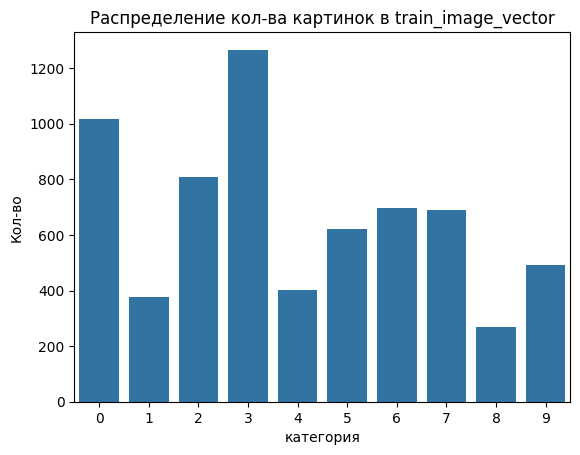

In [39]:
sns.countplot(x = 'category_t', data=train_image_vector)
plt.xlabel('категория')
plt.ylabel('Кол-во')
plt.title('Распределение кол-ва картинок в train_image_vector')
plt.show()

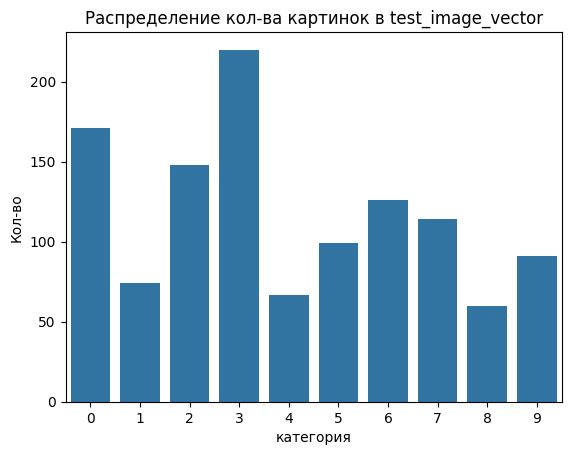

In [40]:
sns.countplot(x = 'category_t', data=test_image_vector)
plt.xlabel('категория')
plt.ylabel('Кол-во')
plt.title('Распределение кол-ва картинок в test_image_vector')
plt.show()

<span style="color: blue;"> Теперь создадим отдельную папку с изображениями для нейросети. P.S. данная папка была ранее сформирована, её можно скачать по ранее указанным ссылкам, поэтому для экономии времени код закомментирован.</span>

In [41]:
def copy_files(copy_dir, test_or_train_dir,  data, new_dir = 'data_to_CV', create_new_dir = False):
    '''функция создаёт отдельную папку с указаным названием, и копирует туда файлы'''
    
#     создаём новую папку куда будем копировать файлы
    try:
        if create_new_dir:
            os.makedirs(new_dir)
    except Exception as e:
        print('ошибка ', e)
        pass

        
    try:
        os.makedirs(f'{new_dir}/{test_or_train_dir}')
    except Exception as e:
        print('ошибка ', e)
        pass
    
    
#  создаём папку для каждой категории фотографии если её нет
    for i in data['category'].unique():
        if not os.path.exists(f"{new_dir}/{test_or_train_dir}/{i}"):
            os.makedirs(f"{new_dir}/{test_or_train_dir}/{i}")
            
        # Копируем каждый файл из copy_dir в test_or_train_dir
        for file in data[data['category'] == i].index:
            shutil.copy(data['path_to_image'][file], f"{new_dir}/{test_or_train_dir}/{i}/{data['name_image'][file]}") 
#             print(f"Файл {file} скопирован в папку {target_dir}")

In [42]:
# copy_files('./data', 'train',  train, new_dir = 'data_to_CV', create_new_dir = True)

In [43]:
# copy_files('./data', 'test',  test, new_dir = 'data_to_CV', create_new_dir = False)

<span style="color: blue;"> Проверим, сходится ли кол-во изображений.</span>

In [44]:
train.groupby('category')['category'].count()

category
anime          1018
black metal     376
classical       807
country        1266
disco           401
edm             620
jazz            695
pop             689
rap             268
reggae          490
Name: category, dtype: int64

In [45]:
for path, dir_list, file_list in os.walk('data_to_CV/train'):
    path = {path.split("\\")[-1]}
    print(f'Класс -- {path}')
    print(f'   -- кол-во файлов {len(file_list)}')

Класс -- {'data_to_CV/train'}
   -- кол-во файлов 0
Класс -- {'data_to_CV/train/anime'}
   -- кол-во файлов 1018
Класс -- {'data_to_CV/train/reggae'}
   -- кол-во файлов 490
Класс -- {'data_to_CV/train/jazz'}
   -- кол-во файлов 695
Класс -- {'data_to_CV/train/classical'}
   -- кол-во файлов 807
Класс -- {'data_to_CV/train/rap'}
   -- кол-во файлов 268
Класс -- {'data_to_CV/train/black metal'}
   -- кол-во файлов 376
Класс -- {'data_to_CV/train/edm'}
   -- кол-во файлов 620
Класс -- {'data_to_CV/train/country'}
   -- кол-во файлов 1266
Класс -- {'data_to_CV/train/pop'}
   -- кол-во файлов 689
Класс -- {'data_to_CV/train/disco'}
   -- кол-во файлов 401


In [46]:
test.groupby('category')['category'].count()

category
anime          171
black metal     74
classical      148
country        220
disco           67
edm             99
jazz           126
pop            114
rap             60
reggae          91
Name: category, dtype: int64

In [47]:
for path, dir_list, file_list in os.walk('data_to_CV/test'):
    path = {path.split("\\")[-1]}
    print(f'Класс -- {path}')
    print(f'   -- кол-во файлов {len(file_list)}')

Класс -- {'data_to_CV/test'}
   -- кол-во файлов 0
Класс -- {'data_to_CV/test/anime'}
   -- кол-во файлов 171
Класс -- {'data_to_CV/test/reggae'}
   -- кол-во файлов 91
Класс -- {'data_to_CV/test/jazz'}
   -- кол-во файлов 126
Класс -- {'data_to_CV/test/classical'}
   -- кол-во файлов 148
Класс -- {'data_to_CV/test/rap'}
   -- кол-во файлов 60
Класс -- {'data_to_CV/test/black metal'}
   -- кол-во файлов 74
Класс -- {'data_to_CV/test/edm'}
   -- кол-во файлов 99
Класс -- {'data_to_CV/test/country'}
   -- кол-во файлов 220
Класс -- {'data_to_CV/test/pop'}
   -- кол-во файлов 114
Класс -- {'data_to_CV/test/disco'}
   -- кол-во файлов 67


<span style="color: blue;"> Кол-во изображений сходится. Датасет для нейросети готов</span>

<div style="background-color: lightgreen; padding: 10px;">
Вывод: подготовлены датасеты для базовых моделей и нейросети. Для классического ML изображения были разбиты на вектора. Для CV была подготовлена отдельная папка с изображениями, поделенная на train и test.
</div>

# 4. Baseline

<span style="color: blue;"> За основную метрику возьмем f1, т.к. в наших данных присутсвтует дисбаланс по классам. Так же местами в нейросетях убедт также использоваться accuracy. За базовую модель возбмём Catboost</span>

In [48]:
test_image_vector.head()

,0_i,1_i,2_i,3_i,4_i,5_i,6_i,7_i,8_i,9_i,...,2039_i,2040_i,2041_i,2042_i,2043_i,2044_i,2045_i,2046_i,2047_i,category_t
0,0.000000,0.019124,0.000000,0.000000,0.787765,0.044309,0.017522,5.157182,0.000000,0.313312,...,0.000000,0.041371,0.107506,0.000000,0.199363,0.449660,0.000000,0.0,0.000330,7
1,0.046987,0.009820,0.014566,0.020168,1.235301,0.361289,0.000000,0.026476,0.315014,0.017394,...,0.233275,0.000000,0.126403,0.013739,0.077038,0.195807,0.105725,0.0,0.384083,7
2,0.095677,0.000000,0.000000,0.000000,2.285575,0.000000,0.127231,0.566642,0.058171,0.038742,...,0.000000,0.030370,1.157704,0.000000,0.026053,1.918655,0.375835,0.0,0.000000,7
3,0.000000,0.028346,0.012055,0.970285,0.424891,0.008621,0.005937,0.105153,0.000000,0.391674,...,0.000000,0.030481,0.004376,0.011567,0.000000,0.011628,0.000000,0.0,0.003507,6
4,0.011984,0.217154,0.019979,0.000000,1.077066,0.000000,0.000000,0.000000,0.181689,0.000000,...,0.000000,0.011437,0.075382,0.000000,0.033865,0.000000,0.100373,0.0,0.000000,6


In [49]:
# добавим валидационную выборку 
train, valid = train_test_split(train_image_vector, test_size = 0.2, shuffle = True, random_state = RANDOM)

In [50]:
# трейн
train_X = train.drop('category_t', axis = 1)
train_y = train['category_t']

# валидация
valid_X = valid.drop('category_t', axis = 1)
valid_y = valid['category_t']

# тест
test_X = test_image_vector.drop('category_t', axis = 1)
test_y = test_image_vector['category_t']

In [51]:
# %%time
# model = CatBoostClassifier(random_state = RANDOM)
# model.fit(train_X, train_y)

# pred = model.predict(valid_X)
# f1 = f1_score(valid_y, pred, average =  'micro')
# print(f'f1_score на базавой модели составил {f1}')

<span style="color: blue;"> f1_score на базовой модели составил 0.65 </span>

# 5. Улучшение baseline

In [52]:
def Classifier_CatBoost_1(trial):

#     параметры
    iterations = trial.suggest_int("iterations", 500, 800)
    depth = trial.suggest_int("depth", 5, 9)
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 0.03, log=False)
    auto_class_weights = trial.suggest_categorical("auto_class_weights", ["Balanced", None, "SqrtBalanced"])

    print( iterations, depth , learning_rate, auto_class_weights)

    model = CatBoostClassifier(iterations = iterations,
                               depth = depth,
                               classes_count = 10,
                               auto_class_weights = auto_class_weights,
                               learning_rate = learning_rate,
                               random_state = RANDOM, verbose = 1)

    start = time.time()
                                                  
    model.fit(train_X, train_y)
                                                  
    end = time.time()

    print(f'Время обучения составило = {round(end - start, 2)} секунд')

    pred = model.predict(valid_X)
    score = f1_score(valid_y, pred, average =  'micro')

    return score

In [53]:
# %%time
# study_cut = optuna.create_study(direction="maximize")
# study_cut.optimize(Classifier_CatBoost_1, n_trials=10)
# study_cut.best_params

[I 2024-04-27 02:28:38,607] Trial 5 finished with value: 0.6372549019607843 and parameters: {'iterations': 582, 'depth': 7, 'learning_rate': 0.08447829704372982, 'auto_class_weights': 'SqrtBalanced'}. Best is trial 5 with value: 0.6372549019607843.

<span style="color: blue;"> Не получилось добиться лучшей метрики, чем у базовой модели. Попробуем нейросети </span>

<font color="blue"> <font size=5> Baseline нейросети</font> </font>

https://towardsdatascience.com/pytorch-tabular-multiclass-classification-9f8211a123ab

In [54]:
# аналогично поделим на трейн, валид, тест
# ВАЖНО, данные не перезаписываются, это новые переменные
X_trainval, X_test, y_trainval, y_test = train_X, test_X, train_y, test_y
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.1, stratify=y_trainval, random_state=RANDOM)

In [55]:
# полведем скалирование данных
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# перевод значений в массив numpy
X_train, y_train = np.array(X_train), np.array(y_train)
X_val, y_val = np.array(X_val), np.array(y_val)
X_test, y_test = np.array(X_test), np.array(y_test)

In [56]:
class ClassifierDataset(Dataset):
    '''наследственный класс pytorch, для подгрузки данных в нейросети через DataLoader'''
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [57]:
# проверка работоспособности класса
train_dataset = ClassifierDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_dataset = ClassifierDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
test_dataset = ClassifierDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())

In [58]:
# скопируем наши категории в json
target_list = []
for _, t in train_dataset:
    target_list.append(t)
    
target_list = torch.tensor(target_list)

In [59]:
target_json

{'anime': 0,
 'black metal': 1,
 'classical': 2,
 'country': 3,
 'disco': 4,
 'edm': 5,
 'jazz': 6,
 'pop': 7,
 'rap': 8,
 'reggae': 9}

In [60]:
# сделаем реверсив нашего списка json 
idx2class = {v: k for k, v in target_json.items()}
idx2class

{0: 'anime',
 1: 'black metal',
 2: 'classical',
 3: 'country',
 4: 'disco',
 5: 'edm',
 6: 'jazz',
 7: 'pop',
 8: 'rap',
 9: 'reggae'}

In [61]:
def get_class_distribution(obj):
    '''Ручной трансформер для подсчета веса каждой категории в датасете'''
    
#     список классов
    count_dict = {
        'anime': 0,
         'black metal': 0,
         'classical': 0,
         'country': 0,
         'disco': 0,
         'edm': 0,
         'jazz': 0,
         'pop': 0,
         'rap': 0,
         'reggae': 0
    }
    
#     базовый счет через циклы
    for i in obj:
        if i == 0: 
            count_dict['anime'] += 1
        elif i == 1: 
            count_dict['black metal'] += 1
        elif i == 2: 
            count_dict['classical'] += 1
        elif i == 3: 
            count_dict['country'] += 1
        elif i == 4: 
            count_dict['disco'] += 1  
        elif i == 5: 
            count_dict['edm'] += 1
        elif i == 6: 
            count_dict['jazz'] += 1
        elif i == 7: 
            count_dict['pop'] += 1
        elif i == 8: 
            count_dict['rap'] += 1
        elif i == 9: 
            count_dict['reggae'] += 1
        else:
            print("Check classes.")
            
    return count_dict

In [62]:
# получаем веса классов
class_count = [i for i in get_class_distribution(y_train).values()]
class_weights = 1./torch.tensor(class_count, dtype=torch.float) 
print(class_weights)

tensor([0.0014, 0.0038, 0.0017, 0.0011, 0.0035, 0.0023, 0.0020, 0.0020, 0.0050,
        0.0028])


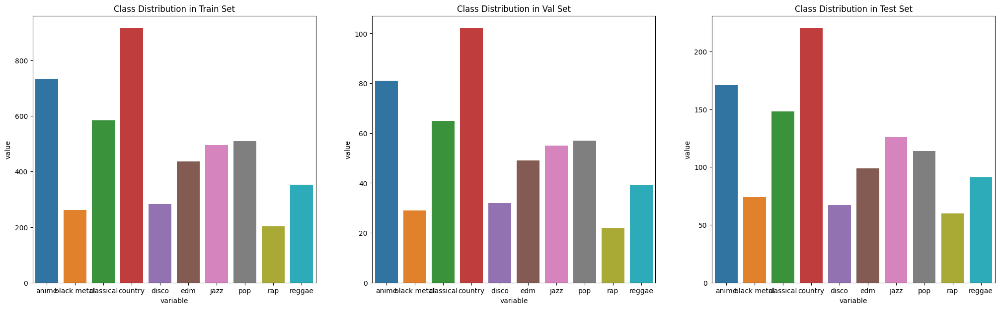

In [63]:
# посмотрим на распределение картинок в выборках

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25,7))

# Train
sns.barplot(data = pd.DataFrame.from_dict([get_class_distribution(y_train)]).melt(), x = "variable", y="value", hue="variable",  ax=axes[0]).set_title('Class Distribution in Train Set')

# Validation
sns.barplot(data = pd.DataFrame.from_dict([get_class_distribution(y_val)]).melt(), x = "variable", y="value", hue="variable",  ax=axes[1]).set_title('Class Distribution in Val Set')

# Test
sns.barplot(data = pd.DataFrame.from_dict([get_class_distribution(y_test)]).melt(), x = "variable", y="value", hue="variable",  ax=axes[2]).set_title('Class Distribution in Test Set')

plt.show()

In [64]:
# возьмеем тензор весов
class_weights_all = class_weights[target_list]
class_weights_all

tensor([0.0014, 0.0020, 0.0035,  ..., 0.0035, 0.0017, 0.0011])

In [65]:
# Воспользуемся функцией WeightedRandomSampler и применим наши веса классов
weighted_sampler = WeightedRandomSampler(
    weights=class_weights_all,
    num_samples=len(class_weights_all),
    replacement=True
)

In [66]:
# базовые параметры нейросети
# EPOCHS = 300
EPOCHS = 50
BATCH_SIZE = 64
LEARNING_RATE = 0.0007
NUM_FEATURES = X_train.shape[1]
NUM_CLASSES = 10

In [67]:
# Сформируем Data Loader
train_loader = DataLoader(dataset=train_dataset,
                          batch_size=BATCH_SIZE,
                          sampler=weighted_sampler
)
val_loader = DataLoader(dataset=val_dataset, batch_size=1)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [68]:
# сформируем класс нейросети
class MulticlassClassification(nn.Module):

    def __init__(self, num_feature, num_class):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(num_feature, 512)
        self.layer_2 = nn.Linear(512, 128)
        self.layer_3 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_class) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.batchnorm1 = nn.BatchNorm1d(512)
        self.batchnorm2 = nn.BatchNorm1d(128)
        self.batchnorm3 = nn.BatchNorm1d(64)
        
    def forward(self, x):
        x = self.layer_1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.layer_2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_out(x)
        
        return x

In [69]:
# Проверим дейвайс
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if device.type == "cpu":
    try:
        device = torch_directml.device()
    except:
        device = torch.device("cpu")
        
print(device)


cpu


In [70]:
# проверим корректность сформированной нейросети
model = MulticlassClassification(num_feature = NUM_FEATURES, num_class=NUM_CLASSES)
model.to(device)

# выберем параметры для обучения
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
print(model)

MulticlassClassification(
  (layer_1): Linear(in_features=2048, out_features=512, bias=True)
  (layer_2): Linear(in_features=512, out_features=128, bias=True)
  (layer_3): Linear(in_features=128, out_features=64, bias=True)
  (layer_out): Linear(in_features=64, out_features=10, bias=True)
  (relu): ReLU()
  (dropout): Dropout(p=0.2, inplace=False)
  (batchnorm1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnorm3): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


In [71]:
def multi_acc(y_pred, y_test):
    '''функция для подсчета accuracy в нейросети'''
    y_pred_softmax = torch.log_softmax(y_pred, dim = 1)
    _, y_pred_tags = torch.max(y_pred_softmax, dim = 1)    
    
    correct_pred = (y_pred_tags == y_test).float()
    acc = correct_pred.sum() / len(correct_pred)
    
    acc = torch.round(acc * 100)
    
    return acc

In [72]:
accuracy_stats = {
    'train': [],
    "val": []
}
loss_stats = {
    'train': [],
    "val": []
}

In [73]:
print("Begin training.")
for e in tqdm(range(1, EPOCHS+1)):
    
    # TRAINING
    train_epoch_loss = 0
    train_epoch_acc = 0
    model.train()
    for X_train_batch, y_train_batch in train_loader:
        X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
        optimizer.zero_grad()
        
        y_train_pred = model(X_train_batch)
        
        train_loss = criterion(y_train_pred, y_train_batch)
        train_acc = multi_acc(y_train_pred, y_train_batch)
        
        train_loss.backward()
        optimizer.step()
        
        train_epoch_loss += train_loss.item()
        train_epoch_acc += train_acc.item()
        
        
    # VALIDATION    
    with torch.no_grad():
        
        val_epoch_loss = 0
        val_epoch_acc = 0
        
        model.eval()
        for X_val_batch, y_val_batch in val_loader:
            X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)
            
            y_val_pred = model(X_val_batch)
                        
            val_loss = criterion(y_val_pred, y_val_batch)
            val_acc = multi_acc(y_val_pred, y_val_batch)
            
            val_epoch_loss += val_loss.item()
            val_epoch_acc += val_acc.item()
    loss_stats['train'].append(train_epoch_loss/len(train_loader))
    loss_stats['val'].append(val_epoch_loss/len(val_loader))
    accuracy_stats['train'].append(train_epoch_acc/len(train_loader))
    accuracy_stats['val'].append(val_epoch_acc/len(val_loader))
                              
    
    print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.5f} | Val Loss: {val_epoch_loss/len(val_loader):.5f} | Train Acc: {train_epoch_acc/len(train_loader):.3f}| Val Acc: {val_epoch_acc/len(val_loader):.3f}')


Begin training.


  2%|█▍                                                                        | 1/50 [00:00<00:26,  1.84it/s]

Epoch 001: | Train Loss: 1.43357 | Val Loss: 1.68503 | Train Acc: 48.720| Val Acc: 45.763


  4%|██▉                                                                       | 2/50 [00:01<00:25,  1.86it/s]

Epoch 002: | Train Loss: 0.81970 | Val Loss: 1.47750 | Train Acc: 71.347| Val Acc: 52.354


  6%|████▍                                                                     | 3/50 [00:01<00:25,  1.88it/s]

Epoch 003: | Train Loss: 0.52176 | Val Loss: 1.37968 | Train Acc: 81.653| Val Acc: 55.744


  8%|█████▉                                                                    | 4/50 [00:02<00:24,  1.88it/s]

Epoch 004: | Train Loss: 0.34863 | Val Loss: 1.39018 | Train Acc: 88.173| Val Acc: 55.367


 10%|███████▍                                                                  | 5/50 [00:02<00:23,  1.88it/s]

Epoch 005: | Train Loss: 0.24674 | Val Loss: 1.35652 | Train Acc: 91.200| Val Acc: 58.757


 12%|████████▉                                                                 | 6/50 [00:03<00:23,  1.90it/s]

Epoch 006: | Train Loss: 0.17565 | Val Loss: 1.39539 | Train Acc: 93.907| Val Acc: 54.802


 14%|██████████▎                                                               | 7/50 [00:03<00:22,  1.89it/s]

Epoch 007: | Train Loss: 0.12249 | Val Loss: 1.49343 | Train Acc: 95.760| Val Acc: 55.367


 16%|███████████▊                                                              | 8/50 [00:04<00:22,  1.90it/s]

Epoch 008: | Train Loss: 0.09643 | Val Loss: 1.55678 | Train Acc: 96.680| Val Acc: 57.627


 18%|█████████████▎                                                            | 9/50 [00:04<00:21,  1.89it/s]

Epoch 009: | Train Loss: 0.08061 | Val Loss: 1.52815 | Train Acc: 97.040| Val Acc: 57.627


 20%|██████████████▌                                                          | 10/50 [00:05<00:21,  1.87it/s]

Epoch 010: | Train Loss: 0.06907 | Val Loss: 1.67755 | Train Acc: 97.507| Val Acc: 56.685


 22%|████████████████                                                         | 11/50 [00:05<00:20,  1.87it/s]

Epoch 011: | Train Loss: 0.05445 | Val Loss: 1.91770 | Train Acc: 98.093| Val Acc: 54.049


 24%|█████████████████▌                                                       | 12/50 [00:06<00:20,  1.87it/s]

Epoch 012: | Train Loss: 0.08220 | Val Loss: 1.80204 | Train Acc: 96.987| Val Acc: 55.367


 26%|██████████████████▉                                                      | 13/50 [00:06<00:19,  1.88it/s]

Epoch 013: | Train Loss: 0.06086 | Val Loss: 1.81366 | Train Acc: 97.707| Val Acc: 56.121


 28%|████████████████████▍                                                    | 14/50 [00:07<00:19,  1.87it/s]

Epoch 014: | Train Loss: 0.04907 | Val Loss: 1.81858 | Train Acc: 98.160| Val Acc: 56.309


 30%|█████████████████████▉                                                   | 15/50 [00:07<00:18,  1.87it/s]

Epoch 015: | Train Loss: 0.04428 | Val Loss: 1.84387 | Train Acc: 98.427| Val Acc: 56.309


 32%|███████████████████████▎                                                 | 16/50 [00:08<00:18,  1.87it/s]

Epoch 016: | Train Loss: 0.05174 | Val Loss: 1.92735 | Train Acc: 98.253| Val Acc: 54.802


 34%|████████████████████████▊                                                | 17/50 [00:09<00:17,  1.88it/s]

Epoch 017: | Train Loss: 0.04643 | Val Loss: 1.92435 | Train Acc: 98.227| Val Acc: 56.121


 36%|██████████████████████████▎                                              | 18/50 [00:09<00:17,  1.87it/s]

Epoch 018: | Train Loss: 0.03220 | Val Loss: 1.95250 | Train Acc: 98.880| Val Acc: 54.802


 38%|███████████████████████████▋                                             | 19/50 [00:10<00:16,  1.87it/s]

Epoch 019: | Train Loss: 0.03586 | Val Loss: 1.91417 | Train Acc: 98.707| Val Acc: 57.627


 40%|█████████████████████████████▏                                           | 20/50 [00:10<00:15,  1.88it/s]

Epoch 020: | Train Loss: 0.03487 | Val Loss: 2.01997 | Train Acc: 98.573| Val Acc: 56.121


 42%|██████████████████████████████▋                                          | 21/50 [00:11<00:15,  1.86it/s]

Epoch 021: | Train Loss: 0.03439 | Val Loss: 2.05231 | Train Acc: 98.773| Val Acc: 55.179


 44%|████████████████████████████████                                         | 22/50 [00:11<00:14,  1.87it/s]

Epoch 022: | Train Loss: 0.04936 | Val Loss: 2.10175 | Train Acc: 98.200| Val Acc: 53.296


 46%|█████████████████████████████████▌                                       | 23/50 [00:12<00:14,  1.87it/s]

Epoch 023: | Train Loss: 0.05252 | Val Loss: 1.96357 | Train Acc: 97.933| Val Acc: 58.380


 48%|███████████████████████████████████                                      | 24/50 [00:12<00:13,  1.89it/s]

Epoch 024: | Train Loss: 0.03810 | Val Loss: 2.16379 | Train Acc: 98.333| Val Acc: 54.802


 50%|████████████████████████████████████▌                                    | 25/50 [00:13<00:13,  1.88it/s]

Epoch 025: | Train Loss: 0.03603 | Val Loss: 2.06828 | Train Acc: 98.707| Val Acc: 54.426


 52%|█████████████████████████████████████▉                                   | 26/50 [00:13<00:12,  1.86it/s]

Epoch 026: | Train Loss: 0.02322 | Val Loss: 2.15677 | Train Acc: 98.867| Val Acc: 55.367


 54%|███████████████████████████████████████▍                                 | 27/50 [00:14<00:12,  1.84it/s]

Epoch 027: | Train Loss: 0.02335 | Val Loss: 2.26086 | Train Acc: 98.880| Val Acc: 54.802


 56%|████████████████████████████████████████▉                                | 28/50 [00:14<00:11,  1.84it/s]

Epoch 028: | Train Loss: 0.02534 | Val Loss: 2.25131 | Train Acc: 99.080| Val Acc: 54.614


 58%|██████████████████████████████████████████▎                              | 29/50 [00:15<00:11,  1.83it/s]

Epoch 029: | Train Loss: 0.02351 | Val Loss: 2.23918 | Train Acc: 99.027| Val Acc: 54.237


 60%|███████████████████████████████████████████▊                             | 30/50 [00:16<00:10,  1.84it/s]

Epoch 030: | Train Loss: 0.03596 | Val Loss: 2.27097 | Train Acc: 98.360| Val Acc: 54.049


 62%|█████████████████████████████████████████████▎                           | 31/50 [00:16<00:10,  1.85it/s]

Epoch 031: | Train Loss: 0.02318 | Val Loss: 2.36875 | Train Acc: 99.013| Val Acc: 56.497


 64%|██████████████████████████████████████████████▋                          | 32/50 [00:17<00:09,  1.86it/s]

Epoch 032: | Train Loss: 0.02181 | Val Loss: 2.34649 | Train Acc: 99.107| Val Acc: 55.367


 66%|████████████████████████████████████████████████▏                        | 33/50 [00:17<00:09,  1.85it/s]

Epoch 033: | Train Loss: 0.02022 | Val Loss: 2.34231 | Train Acc: 99.213| Val Acc: 54.614


 68%|█████████████████████████████████████████████████▋                       | 34/50 [00:18<00:08,  1.84it/s]

Epoch 034: | Train Loss: 0.02256 | Val Loss: 2.32078 | Train Acc: 99.107| Val Acc: 56.874


 70%|███████████████████████████████████████████████████                      | 35/50 [00:18<00:08,  1.84it/s]

Epoch 035: | Train Loss: 0.02650 | Val Loss: 2.52315 | Train Acc: 98.800| Val Acc: 55.744


 72%|████████████████████████████████████████████████████▌                    | 36/50 [00:19<00:07,  1.85it/s]

Epoch 036: | Train Loss: 0.03147 | Val Loss: 2.44166 | Train Acc: 98.560| Val Acc: 54.614


 74%|██████████████████████████████████████████████████████                   | 37/50 [00:19<00:06,  1.87it/s]

Epoch 037: | Train Loss: 0.02266 | Val Loss: 2.49132 | Train Acc: 98.933| Val Acc: 54.991


 76%|███████████████████████████████████████████████████████▍                 | 38/50 [00:20<00:06,  1.87it/s]

Epoch 038: | Train Loss: 0.02572 | Val Loss: 2.42286 | Train Acc: 98.747| Val Acc: 54.802


 78%|████████████████████████████████████████████████████████▉                | 39/50 [00:20<00:05,  1.88it/s]

Epoch 039: | Train Loss: 0.01917 | Val Loss: 2.34447 | Train Acc: 99.240| Val Acc: 55.932


 80%|██████████████████████████████████████████████████████████▍              | 40/50 [00:21<00:05,  1.88it/s]

Epoch 040: | Train Loss: 0.02800 | Val Loss: 2.36643 | Train Acc: 98.720| Val Acc: 55.744


 82%|███████████████████████████████████████████████████████████▊             | 41/50 [00:21<00:04,  1.87it/s]

Epoch 041: | Train Loss: 0.02517 | Val Loss: 2.40055 | Train Acc: 98.773| Val Acc: 57.250


 84%|█████████████████████████████████████████████████████████████▎           | 42/50 [00:22<00:04,  1.87it/s]

Epoch 042: | Train Loss: 0.05179 | Val Loss: 2.48810 | Train Acc: 97.867| Val Acc: 54.237


 86%|██████████████████████████████████████████████████████████████▊          | 43/50 [00:23<00:03,  1.87it/s]

Epoch 043: | Train Loss: 0.03231 | Val Loss: 2.40953 | Train Acc: 98.493| Val Acc: 55.556


 88%|████████████████████████████████████████████████████████████████▏        | 44/50 [00:23<00:03,  1.87it/s]

Epoch 044: | Train Loss: 0.03414 | Val Loss: 2.57267 | Train Acc: 98.387| Val Acc: 56.497


 90%|█████████████████████████████████████████████████████████████████▋       | 45/50 [00:24<00:02,  1.87it/s]

Epoch 045: | Train Loss: 0.02410 | Val Loss: 2.51645 | Train Acc: 99.160| Val Acc: 57.250


 92%|███████████████████████████████████████████████████████████████████▏     | 46/50 [00:24<00:02,  1.86it/s]

Epoch 046: | Train Loss: 0.02131 | Val Loss: 2.47703 | Train Acc: 99.067| Val Acc: 55.179


 94%|████████████████████████████████████████████████████████████████████▌    | 47/50 [00:25<00:01,  1.86it/s]

Epoch 047: | Train Loss: 0.02233 | Val Loss: 2.50138 | Train Acc: 98.853| Val Acc: 56.309


 96%|██████████████████████████████████████████████████████████████████████   | 48/50 [00:25<00:01,  1.87it/s]

Epoch 048: | Train Loss: 0.01418 | Val Loss: 2.44460 | Train Acc: 99.253| Val Acc: 55.179


 98%|███████████████████████████████████████████████████████████████████████▌ | 49/50 [00:26<00:00,  1.86it/s]

Epoch 049: | Train Loss: 0.02012 | Val Loss: 2.44350 | Train Acc: 99.040| Val Acc: 56.309


100%|█████████████████████████████████████████████████████████████████████████| 50/50 [00:26<00:00,  1.87it/s]

Epoch 050: | Train Loss: 0.01404 | Val Loss: 2.40461 | Train Acc: 99.333| Val Acc: 57.062


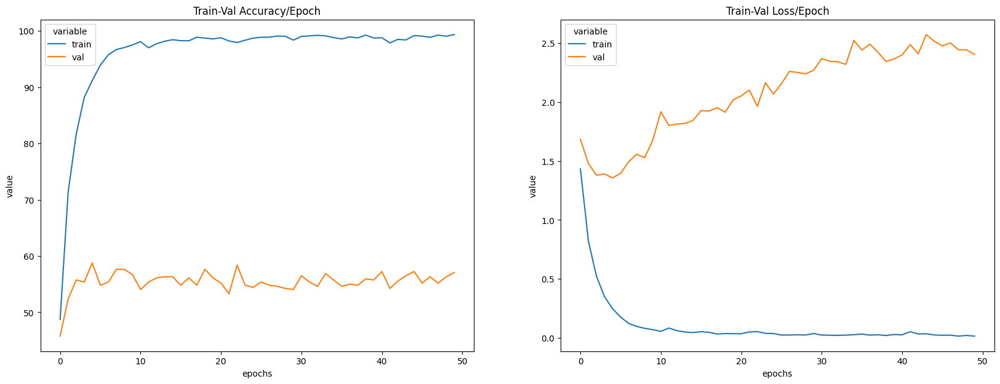

In [74]:
# из полученных во время обучения данных формируем датасеты
train_val_acc_df = pd.DataFrame.from_dict(accuracy_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
train_val_loss_df = pd.DataFrame.from_dict(loss_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})

# строим графики хода обучения
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
sns.lineplot(data=train_val_acc_df, x = "epochs", y="value", hue="variable",  ax=axes[0]).set_title('Train-Val Accuracy/Epoch')
sns.lineplot(data=train_val_loss_df, x = "epochs", y="value", hue="variable", ax=axes[1]).set_title('Train-Val Loss/Epoch')
plt.show()

In [75]:
# предсказание на тесте 
y_pred_list = []
with torch.no_grad():
    model.eval()
    for X_batch, _ in test_loader:
        X_batch = X_batch.to(device)
        y_test_pred = model(X_batch)
        _, y_pred_tags = torch.max(y_test_pred, dim = 1)
        y_pred_list.append(y_pred_tags.cpu().numpy())
y_pred_list = [a.squeeze().tolist() for a in y_pred_list]

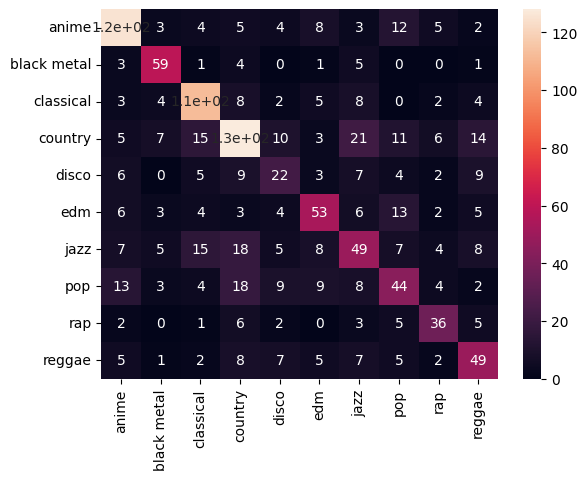

In [76]:
confusion_matrix_df = pd.DataFrame(confusion_matrix(y_test, y_pred_list)).rename(columns=idx2class, index=idx2class)

sns.heatmap(confusion_matrix_df, annot=True)
plt.show()

<font color="blue"> <font size=5> Модернизация и улучшения baseline нейросети</font>

In [77]:
class ClassifierDataset(Dataset):
    '''Формирование датасета'''
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [78]:
class Trainer():
    """
    Parameters:
        dataset: пользовательский класс, предобрабатывающий данные
        loss_f: функция потерь
        learning_rate: величина градиентного шага
        epoch_amount: общее количество эпох
        batch_size: размер одного бача
        max_batches_per_epoch: максимальное количество бачей, 
                               подаваемых в модель в одну эпоху
        device: устройство для вычислений
        early_stopping: количество эпох без улучшений до остановки обучения
        optim: оптимизатор
        scheduler: регулятор градиентного шага
        permutate: перемешивание тренировочной выборки перед обучением

    Attributes:
        start_model: необученная модель
        best_model: модель, после обучения
        train_loss: средние значения функции потерь на тренировочных 
                    данных в каждой эпохе
        val_loss: средние значения функции потерь на валидационных 
                  данных в каждой эпохе

    Methods:
        fit: обучение модели
        predict: возвращает предсказание обученной моделью

    """
    def __init__(self,  dataset, net, loss_f, learning_rate=1e-3, 
                epoch_amount=10, batch_size=12, 
                max_batches_per_epoch=None,
                device='cpu', early_stopping=10, 
                optim=torch.optim.Adam, 
                scheduler=None, permutate=True):

#        все гиперпараметры
        self.loss_f = loss_f
        self.learning_rate = learning_rate
        self.epoch_amount = epoch_amount
        self.batch_size = batch_size
        self.max_batches_per_epoch = max_batches_per_epoch
        self.device = device
        self.early_stopping = early_stopping
        self.optim = optim
        self.scheduler = scheduler
        self.permutate = permutate
        self.dataset = dataset
        self.start_model = net
        self.best_model = net

    
        self.accuracy_stats = {
        'train': [],
        "val": []
        }
        self.loss_stats = {
            'train': [],
            "val": []
        }
    
    
    def get_class_distribution(self, obj):
        '''Вычисление весов классов'''
        
        count_dict = {
            'anime': 0,
             'black metal': 0,
             'classical': 0,
             'country': 0,
             'disco': 0,
             'edm': 0,
             'jazz': 0,
             'pop': 0,
             'rap': 0,
             'reggae': 0
        }

        for i in obj:
            if i == 0: 
                count_dict['anime'] += 1
            elif i == 1: 
                count_dict['black metal'] += 1
            elif i == 2: 
                count_dict['classical'] += 1
            elif i == 3: 
                count_dict['country'] += 1
            elif i == 4: 
                count_dict['disco'] += 1  
            elif i == 5: 
                count_dict['edm'] += 1
            elif i == 6: 
                count_dict['jazz'] += 1
            elif i == 7: 
                count_dict['pop'] += 1
            elif i == 8: 
                count_dict['rap'] += 1
            elif i == 9: 
                count_dict['reggae'] += 1
            else:
                print("Check classes.")
            
        return count_dict
    
    def multi_acc(self, y_pred, y_test):
        '''Вычисление метрики accuracy во время обучения'''
        y_pred_softmax = torch.log_softmax(y_pred, dim = 1)
        _, y_pred_tags = torch.max(y_pred_softmax, dim = 1)    

        correct_pred = (y_pred_tags == y_test).float()
        acc = correct_pred.sum() / len(correct_pred)

        acc = torch.round(acc * 100)

        return acc
    
    
    def predict(self, X):
        '''предсказание модели'''
        return self.best_model(X)
    
    def fit(self, X_train, y_train):
        '''Обучение модели'''
        
#         Фиксируем основные переданные параметры
        model = self.start_model
        EPOCHS = self.epoch_amount
        BATCH_SIZE = self.batch_size
        LEARNING_RATE = self.learning_rate
        torch.manual_seed(RANDOM)
        
        '''обучение'''
        
#         делим полученные датасеты на трейн и вал
        X_train, X_val, y_train, y_val = train_test_split(X_train,
                                                          y_train,
                                                          test_size=0.1,
                                                          stratify=y_train,
                                                          random_state=RANDOM)
#         скалируем полученные даннные
        self.scaler = MinMaxScaler()
        X_train = self.scaler.fit_transform(X_train)
        X_val = self.scaler.transform(X_val)
        
#       меняем формут на numpy
        X_train, y_train = np.array(X_train), np.array(y_train)
        X_val, y_val = np.array(X_val), np.array(y_val)
        
#       загружаем данные из нашего класса 
        train_dataset = self.dataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
        val_dataset = self.dataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
        
#         список классов
        target_list = []
        for _, t in train_dataset:
            target_list.append(t)
        
#         трансофрмируем список классов 
        self.target_list = torch.tensor(target_list)
        self.idx2class = {v: k for k, v in target_json.items()}
        
#        вычисляем веса классов
        class_count = [i for i in self.get_class_distribution(y_train).values()]
        class_weights = 1./torch.tensor(class_count, dtype = torch.float) 
        class_weights_all = class_weights[self.target_list]
        print(class_weights_all)
        
#         применяем смешивание картинок п овесам классов
        weighted_sampler = WeightedRandomSampler(
                            weights=class_weights_all,
                            num_samples=len(class_weights_all),
                            replacement=True)
        
        
#         создаём даталоудеры 
        train_loader = DataLoader(dataset=train_dataset,
                          batch_size = BATCH_SIZE,
                          sampler = weighted_sampler)
        val_loader = DataLoader(dataset=val_dataset, batch_size=1)


        best_val_loss = float('inf') # Лучшее значение функции потерь на валидационной выборке
                                     # функции потерь на валидационной выборке
        best_ep = 0                  # Эпоха, на которой достигалось лучшее 
                                     # значение функции потерь на валидационной выборке
        
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        if device.type == "cpu":
            try:
                device = torch_directml.device()
            except:
                device = torch.device("cpu")

        print(device)

        model.to(device)
        criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
        optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
        
        
        print(f'Вставленные параметры эпох = {EPOCHS}, батч = {BATCH_SIZE}, LEARNING_RATE =  {LEARNING_RATE}, ранняя остановка = {self.early_stopping}')
        
        print("Begin training.")
        for e in range(1, EPOCHS+1):
    
            # TRAINING
            train_epoch_loss = 0
            train_epoch_acc = 0
            model.train()
            for X_train_batch, y_train_batch in train_loader:
                X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
                optimizer.zero_grad()

                y_train_pred = model(X_train_batch)

                train_loss = criterion(y_train_pred, y_train_batch)
                train_acc = self.multi_acc(y_train_pred, y_train_batch)

                train_loss.backward()
                optimizer.step()

                train_epoch_loss += train_loss.item()
                train_epoch_acc += train_acc.item()


            # VALIDATION    
            with torch.no_grad():

                val_epoch_loss = 0
                val_epoch_acc = 0

                model.eval()
                for X_val_batch, y_val_batch in val_loader:
                    X_val_batch, y_val_batch = X_val_batch.to(device), y_val_batch.to(device)

                    y_val_pred = model(X_val_batch)

                    val_loss = criterion(y_val_pred, y_val_batch)
                    val_acc = self.multi_acc(y_val_pred, y_val_batch)

                    val_epoch_loss += val_loss.item()
                    val_epoch_acc += val_acc.item()
                    
#             сохраняем полученные результаты в списки
            self.loss_stats['train'].append(train_epoch_loss/len(train_loader))
            self.loss_stats['val'].append(val_epoch_loss/len(val_loader))
            self.accuracy_stats['train'].append(train_epoch_acc/len(train_loader))
            self.accuracy_stats['val'].append(val_epoch_acc/len(val_loader))

#             делаем проверку на раннюю остановку
            if (val_epoch_loss/len(val_loader)) < best_val_loss:
                self.best_model = model
                best_val_loss = val_epoch_loss/len(val_loader)
                best_ep = e
            # остановка обучения, если результат не меняется
            elif e - best_ep > self.early_stopping:
                print(f'{self.early_stopping} эпоха без улучшений. Прекращаем обучение...')
                print(f'Лучшая эпоха и лосс {best_ep}, {best_val_loss}')
                self.plot_loss_acc()
                break
#             выводим результаты
            
            print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(train_loader):.5f}',
                  f'| Val Loss: {val_epoch_loss/len(val_loader):.5f}',
                  f'| Train Acc: {train_epoch_acc/len(train_loader):.3f}',
                  f'| Val Acc: {val_epoch_acc/len(val_loader):.3f}')
        
#        прорисовка результатов
        self.plot_loss_acc()

    def plot_loss_acc(self):
        '''Функция рисует графики обучения'''
        print()
        print()
        # Create dataframes
        train_val_acc_df = pd.DataFrame.from_dict(self.accuracy_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
        train_val_loss_df = pd.DataFrame.from_dict(self.loss_stats).reset_index().melt(id_vars=['index']).rename(columns={"index":"epochs"})
        # Plot the dataframes
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,7))
        sns.lineplot(data=train_val_acc_df, x = "epochs", y="value", hue="variable",  ax=axes[0]).set_title('Train-Val Accuracy/Epoch')
        sns.lineplot(data=train_val_loss_df, x = "epochs", y="value", hue="variable", ax=axes[1]).set_title('Train-Val Loss/Epoch')


In [79]:
class MulticlassClassification(nn.Module):
    def __init__(self):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(2048, 512)
        self.layer_2 = nn.Linear(512, 128)
        self.layer_3 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, 10) 
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.batchnorm1 = nn.BatchNorm1d(512)
        self.batchnorm2 = nn.BatchNorm1d(128)
        self.batchnorm3 = nn.BatchNorm1d(64)
        
    def forward(self, x):
        x = self.layer_1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.layer_2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_out(x)
        
        return x
        

In [80]:
# net = MulticlassClassification()

params = {
    'dataset': ClassifierDataset,
    'net': MulticlassClassification(),
    'epoch_amount': 50, 
    'learning_rate': 5e-4,
    'early_stopping': 15,
    'batch_size': 128,
    'loss_f': nn.CrossEntropyLoss(),
#     'optim': torch.optim.Adam,
}

X_trainval, X_test, y_trainval, y_test = train_X, test_X, train_y, test_y

# clf = Trainer(**params)
# clf.fit(X_trainval, y_trainval)

<span style="color: blue;"> Попробуем упростить сеть оставив только скрытые слои и 1 новую функцию активации </span>

In [81]:
class MulticlassClassification(nn.Module):
    def __init__(self):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(2048, 512)
        self.layer_2 = nn.Linear(512, 128)
        self.layer_3 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, 10) 
        
        self.relu = nn.ReLU()
        self.relu2 = nn.Sigmoid()
        
    def forward(self, x):
        x = self.layer_1(x)
#         x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.layer_2(x)
#         x = self.batchnorm2(x)
        x = self.relu(x)
#         x = self.dropout(x)
        
        x = self.layer_3(x)
#         x = self.batchnorm3(x)
        x = self.relu(x)
#         x = self.dropout(x)
        
        x = self.layer_out(x)
        x = self.relu2(x)
        return x

In [82]:
net = MulticlassClassification()

params = {
    'dataset': ClassifierDataset,
    'net': MulticlassClassification(),
    'epoch_amount': 100, 
    'learning_rate': 0.0005,
    'early_stopping': 15,
    'batch_size': 128,
    'loss_f': nn.CrossEntropyLoss(),
#     'optim': torch.optim.Adam,
}

X_trainval, X_test, y_trainval, y_test = train_X, test_X, train_y, test_y


# clf = Trainer(**params)
# clf.fit(X_trainval, y_trainval)

In [83]:
class MulticlassClassification(nn.Module):
    def __init__(self):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(2048, 1024)
        self.layer_2 = nn.Linear(1024, 512)
        self.layer_3 = nn.Linear(512, 256)
        self.layer_out = nn.Linear(256, 10) 
        
        
        self.batchnorm1 = nn.BatchNorm1d(1024)
#         self.batchnorm2 = nn.BatchNorm1d(128)
#         self.batchnorm3 = nn.BatchNorm1d(64)
        
        self.relu = nn.Tanh()
#         self.relu2 = nn.Sigmoid()
        
    def forward(self, x):
        x = self.layer_1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.layer_2(x)
#         x = self.batchnorm2(x)
        x = self.relu(x)
#         x = self.dropout(x)
        
        x = self.layer_3(x)
#         x = self.batchnorm3(x)
        x = self.relu(x)
#         x = self.dropout(x)
        
        x = self.layer_out(x)
#         x = self.relu2(x)
        return x

In [84]:
net = MulticlassClassification()

params = {
    'dataset': ClassifierDataset,
    'net': MulticlassClassification(),
    'epoch_amount': 100, 
    'learning_rate': 0.00001,
    'early_stopping': 10,
    'batch_size': 64,
    'loss_f': nn.CrossEntropyLoss(),
#     'optim': torch.optim.Adam,
}

X_trainval, X_test, y_trainval, y_test = train_X, test_X, train_y, test_y

# clf = Trainer(**params)
# clf = Trainer(**params)
# clf.fit(X_trainval, y_trainval)

In [85]:
class MulticlassClassification(nn.Module):
    def __init__(self):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(2048, 128)
        self.layer_out = nn.Linear(128, 10) 
        
        self.dropout = nn.Dropout(p=0.3) 
        self.batchnorm1 = nn.BatchNorm1d(128)
        
        self.relu = nn.ReLU()
        self.tanh = nn.Tanh()
        
    def forward(self, x):
        x = self.layer_1(x) 
        x = self.batchnorm1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.layer_out(x)
        x = self.tanh(x)
        return x

tensor([0.0014, 0.0020, 0.0035,  ..., 0.0035, 0.0017, 0.0011])
cpu
Вставленные параметры эпох = 100, батч = 64, LEARNING_RATE =  5e-05, ранняя остановка = 10
Begin training.
Epoch 001: | Train Loss: 2.10620 | Val Loss: 2.18673 | Train Acc: 23.467 | Val Acc: 24.482
Epoch 002: | Train Loss: 1.86987 | Val Loss: 2.06414 | Train Acc: 37.000 | Val Acc: 29.755
Epoch 003: | Train Loss: 1.75655 | Val Loss: 1.99869 | Train Acc: 44.893 | Val Acc: 33.710
Epoch 004: | Train Loss: 1.66963 | Val Loss: 1.94014 | Train Acc: 49.933 | Val Acc: 38.230
Epoch 005: | Train Loss: 1.59776 | Val Loss: 1.90126 | Train Acc: 54.227 | Val Acc: 41.055
Epoch 006: | Train Loss: 1.54776 | Val Loss: 1.86942 | Train Acc: 56.587 | Val Acc: 43.126
Epoch 007: | Train Loss: 1.49673 | Val Loss: 1.83663 | Train Acc: 60.200 | Val Acc: 45.951
Epoch 008: | Train Loss: 1.44606 | Val Loss: 1.80924 | Train Acc: 63.080 | Val Acc: 48.588
Epoch 009: | Train Loss: 1.42519 | Val Loss: 1.78513 | Train Acc: 64.200 | Val Acc: 48.776
Epoch 0

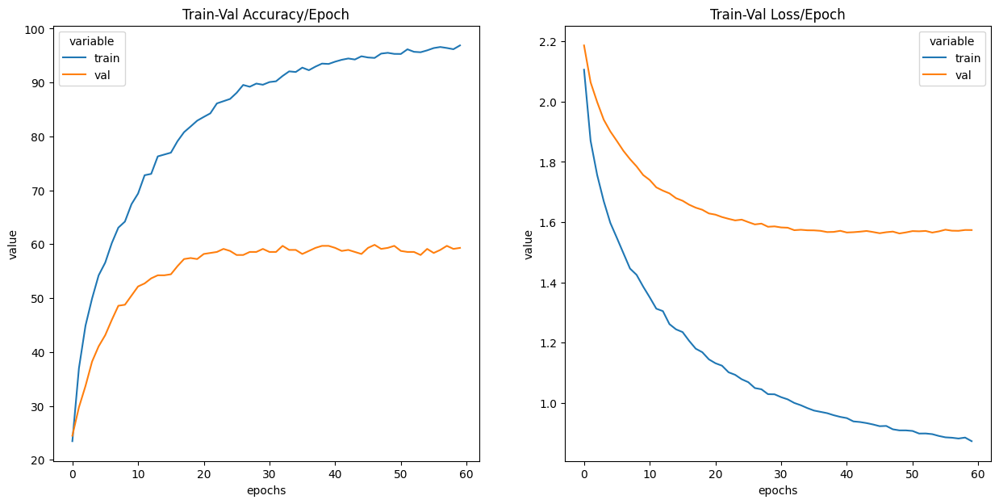

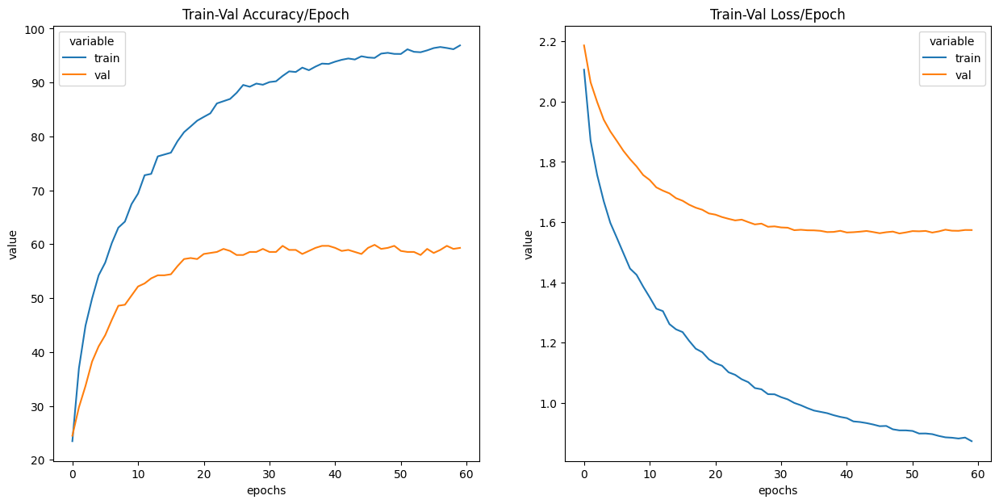

In [86]:
net = MulticlassClassification()

params = {
    'dataset': ClassifierDataset,
    'net': MulticlassClassification(),
    'epoch_amount': 100, 
    'learning_rate': 0.00005,
    'early_stopping': 10,
    'batch_size': 64,
    'loss_f': nn.CrossEntropyLoss(),
#     'optim': torch.optim.Adam,
}

X_trainval, X_test, y_trainval, y_test = train_X, test_X, train_y, test_y

clf = Trainer(**params)
clf.fit(X_trainval, y_trainval)

<span style="color: blue;"> Результат нейросети хуже чем у baseline, попробуем реализовать модель CV  </span>

Epoch 064: | Train Loss: 0.87224 | Val Loss: 1.57162 | Train Acc: 96.520 | Val Acc: 60.075

Ниже предсатвлден код для предсказания результатов на тесте

In [87]:
# X_test = clf.scaler.transform(X_test)
# y_test = np.array(y_test)
# test_dataset = ClassifierDataset(torch.from_numpy(X_test).float(), torch.from_numpy(y_test).long())
# test_loader = DataLoader(dataset=test_dataset, batch_size=1)

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# y_pred_list = []
# with torch.no_grad():
#     for X_batch, _ in test_loader:
#         X_batch = X_batch.to(device)
# #         X_batch = X_batch.to(device)
#         y_test_pred = clf.predict(X_batch)
#         _, y_pred_tags = torch.max(y_test_pred, dim = 1)
#         y_pred_list.append(y_pred_tags.cpu().numpy())
# y_pred_list = [a.squeeze().tolist() for a in y_pred_list]


# print(f1_score(y_pred_list, y_test, average =  'micro'))
# print(accuracy_score(y_pred_list, y_test))

# confusion_matrix_df = pd.DataFrame(confusion_matrix(y_test, y_pred_list)).rename(columns=clf.idx2class, index=clf.idx2class)
# sns.heatmap(confusion_matrix_df, annot=True)

<font color="blue"> <font size=5> Решение задачи при помощи CV baseline </font>

<span style="color: blue;"> Используем тут ранее сформированные папки изображений </span>

In [88]:
def load_dataset():
    '''функция для загрузки данных'''
    
    train_path = 'data_to_CV/train'
    test_path = 'data_to_CV/test'
    
#     Трансформерые исзображений
    transform_train = transforms.Compose([
#         transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
        ])

    transform_test = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
        ])


#     создание загрузчиков данных
    trainset = ImageFolder(root=train_path, transform=transform_train)
    
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=64,
                                              shuffle=True, num_workers=2)

    testset =  test_dataset = ImageFolder(root=test_path, transform=transform_test)
    
    testloader = torch.utils.data.DataLoader(testset, batch_size=64,
                                             shuffle=False, num_workers=2)

    # Class names
    classes = ('anime',
         'black metal',
         'classical',
         'country',
         'disco',
         'edm',
         'jazz',
         'pop',
         'rap',
         'reggae')

    return trainset, trainloader, testset, testloader, classes

In [89]:
trainset, trainloader, testset, testloader, classes = load_dataset()

<span style="color: blue;"> Проверим что функция работает корректно </span>

In [90]:
#функция для вывода изображений
def image_shower(images, labels, n=4):
    
    plt.figure(figsize=(12, 12))
    
    label_im = [classes[label] for label in labels[:n]]
    
    for i, image in enumerate(images[:n]):
        plt.subplot(n, n, i + 1)
        plt.imshow((image.numpy() * 255).astype(np.uint8).transpose((1, 2, 0)).squeeze())
        plt.title(f"Real labels: {label_im[i]}")

#     print("Real Labels: ", ' '.join('%5s' % classes[label] for label in labels[:n]))


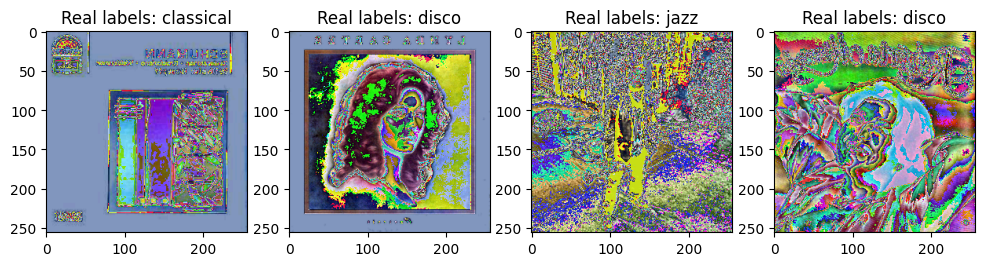

In [91]:
images, labels = next(iter(trainloader))
image_shower(images, labels)

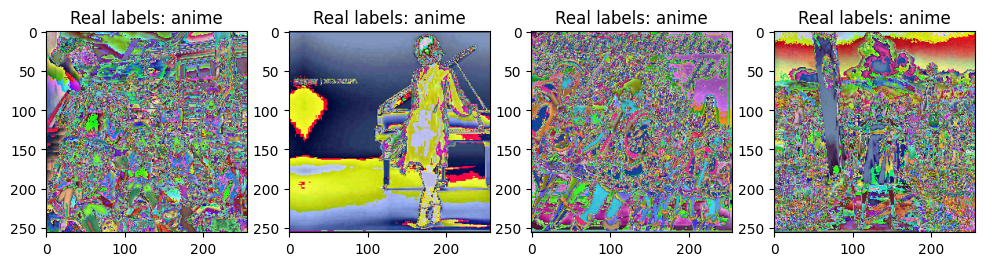

In [92]:
images, labels = next(iter(testloader))
image_shower(images, labels)

In [93]:
def train(model, trainloader, criterion, optimizer, device):
    '''функция для обучения модели'''
    
    train_loss = 0.0
    train_total = 0
    train_correct = 0

    f1_total = []
    f1_correct = []
    
    # Switch to train mode
    model.train()
    
    for inputs, labels in trainloader:
        inputs, labels = inputs.to(device), labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Update training loss
        train_loss += loss.item() * inputs.size(0)

        # Compute training accuracy
        _, predicted = torch.max(outputs, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

        f1_total.append(predicted.cpu().detach().numpy())
        f1_correct.append(labels.cpu().detach().numpy())

    pred_all = []
    for i in f1_total:
        for x in i:
            pred_all.append(x)
    
    true_all = []
    for i in f1_correct:
        for x in i:
            true_all.append(x)

    f1_train = f1_score(pred_all, true_all, average =  'micro')

    # Compute average training loss and accuracy
    train_loss = train_loss / len(trainloader.dataset)
    train_accuracy = 100.0 * train_correct / train_total

    return model, train_loss, train_accuracy, f1_train

In [94]:
def test(model, testloader, criterion, device):
    '''Функция для тестирования модели во время обучения'''
    test_loss = 0.0
    test_total = 0
    test_correct = 0

    f1_total = []
    f1_correct = []
    # Switch to evaluation mode
    model.eval()

    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Update test loss
            test_loss += loss.item() * inputs.size(0)

            # Compute test accuracy
            _, predicted = torch.max(outputs, 1)
            test_total += labels.size(0)
            test_correct += (predicted == labels).sum().item()

            f1_total.append(predicted.cpu().detach().numpy())
            f1_correct.append(labels.cpu().detach().numpy())

    pred_all = []
    for i in f1_total:
        for x in i:
            pred_all.append(x)
    
    true_all = []
    for i in f1_correct:
        for x in i:
            true_all.append(x)

    f1_test = f1_score(pred_all, true_all, average =  'micro')
    
    # Compute average test loss and accuracy
    test_loss = test_loss / len(testloader.dataset)
    test_accuracy = 100.0 * test_correct / test_total

    return test_loss, test_accuracy, f1_test

In [95]:
def train_epochs(model, trainloader, testloader, criterion, optimizer, device, num_epochs, save_interval=5):
    '''Основная функция для обучения по эпохам (Использует функции train и test)'''
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []
    f1_trains = []
    f1_tests = []
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        model, train_loss, train_accuracy, f1_train = train(model, trainloader, criterion, optimizer, device)
        test_loss, test_accuracy, f1_test = test(model, testloader, criterion, device)

        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        f1_trains.append(f1_train)
        
        test_losses.append(test_loss)
        test_accuracies.append(test_accuracy)
        f1_tests.append(f1_test)
        
        print(f'Train Loss: {train_loss:.4f} - Train Accuracy: {train_accuracy:.2f}% - Train f1_score: {f1_train:.2f}%')
        print(f'Test Loss: {test_loss:.4f} - Test Accuracy: {test_accuracy:.2f}% - Test f1_score: {f1_test:.2f}%')
        print()

        if (epoch + 1) % save_interval == 0:
            # Save the model and variables
            torch.save(model.state_dict(), f'resnet50_{epoch+1}.pth')
            checkpoint = {
              'epoch': epoch + 1,
              'train_losses': train_losses,
              'train_accuracies': train_accuracies,
                'train_f1': f1_trains,
              'test_losses': test_losses,
              'test_accuracies': test_accuracies,
                'test_f1': f1_tests,
              'classes': classes}
            torch.save(checkpoint, f'resnet50_chekpoint_variables_{epoch+1}.pth')

    return model, train_losses, train_accuracies, test_losses, test_accuracies, f1_trains, f1_tests


In [96]:
def plot_loss(train_losses, test_losses):
    '''Функция для прорисовки loss обучения'''
    plt.figure()
    plt.plot(range(len(train_losses)), train_losses, label='Training Loss')
    plt.plot(range(len(test_losses)), test_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    # plt.savefig('loss_plot.png')
    plt.show()

In [97]:
def plot_accuracy(train_accuracies, test_accuracies):
    '''Функция для прорисовки accuracy обучения'''
    plt.figure()
    plt.plot(range(len(train_accuracies)), train_accuracies, label='Training Accuracy')
    plt.plot(range(len(test_accuracies)), test_accuracies, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    # plt.savefig('accuracy_plot.png')
    plt.show()

In [98]:
def plot_f1(f1_trains, f1_tests):
    '''Функция для прорисовки f1 обучения'''
    plt.figure()
    plt.plot(range(len(f1_trains)), f1_trains, label='Training f1_score')
    plt.plot(range(len(f1_tests)), f1_tests, label='Validation f1_score')
    plt.xlabel('Epoch')
    plt.ylabel('f1_score')
    plt.legend()
    # plt.savefig('f1_plot.png')
    plt.show()

In [99]:
def plot_image(dataset, model, classes, device):
    '''Функция выводит случайную фотографию и модель делает по ней предсказание'''
    
    idx = random.randint(0, len(dataset))
    label = dataset[idx][1]
    img = dataset[idx][0].unsqueeze(0).to(device)  # Move the input image tensor to the GPU
    model.eval()
    #model.to(device)  # Move the model to the GPU
    output = model(img)
    _, predicted = torch.max(output.data, 1)
    # Convert the image and show it
    img = img.squeeze().permute(1, 2, 0).cpu()  # Move the image tensor back to the CPU and adjust dimensions
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Predicted: {classes[predicted]}, True: {classes[label]}')
    # plt.savefig('predicted_image.png')
    plt.show()
    print("Predicted label: ", classes[predicted[0].item()])
    print("Actual label: ", classes[label])

In [100]:
def start_learning(model, optimizer, name_model, num_epochs = 10, save_interval = 10, chekpoint_epoch = 10, train_model = True):
    '''Функция для запуска обучения'''
    
    # Flag to control whether to run training or use saved fine-tuned model.
    train_model = train_model

    # Set random seed for reproducibility
    random_seed = RANDOM
    torch.manual_seed(RANDOM)
    np.random.seed(RANDOM)
    random.seed(RANDOM)


    # Move the model to GPU if available
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     print(device)
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    if device.type == "cpu":
        try:
            device = torch_directml.device()
        except:
            device = torch.device("cpu")
    
    print(device)
    
    model = model.to(device)

    # Define loss function and optimizer
#     criterion = nn.CrossEntropyLoss()
    criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
    # Load the dataset
    trainset, trainloader, testset, testloader, classes = load_dataset()

    if train_model:
          # Train the model for 20 epochs, saving every 5 epochs
        num_epochs = num_epochs
        save_interval = save_interval
        model, train_losses, train_accuracies, test_losses, test_accuracies, f1_trains, f1_tests = train_epochs(
              model, trainloader, testloader, criterion, optimizer, device,
              num_epochs, save_interval)

        # Save the final trained model
        torch.save(model.state_dict(), f'{name_model}_resnet50_final_model_epochs_{num_epochs}.pth')

        # Plot and save the loss and accuracy plots
        plot_loss(train_losses, test_losses)
        plot_accuracy(train_accuracies, test_accuracies)
        plot_f1(f1_trains, f1_tests)

        # Plot and save an example image
        plot_image(testset, model, classes, device)
    
    else:
        # Load the pre-trained model
        model.load_state_dict(torch.load(f'{name_model}_resnet50_final_model_epochs_{num_epochs}.pth'))
        # Load the variables
        checkpoint = torch.load(f'resnet50_chekpoint_variables_{chekpoint_epoch}.pth')
        epoch = checkpoint['epoch']
        train_losses = checkpoint['train_losses']
        train_accuracies = checkpoint['train_accuracies']
        test_losses = checkpoint['test_losses']
        test_accuracies = checkpoint['test_accuracies']
        f1_tranins = checkpoint['train_f1'],
        f1_tests = checkpoint['test_f1'],
        classes = checkpoint['classes']
        model.to(device)
        model.eval()

    return model

In [101]:
%%time 

model = models.resnet50()

# Number of classes
num_classes = 10

# Замораживаем параметры модели, чтобы обучать только последний полносвязанный слой
for param in model.parameters():
    param.requires_grad = False

# Modify the final fully connected layer according to the number of classes
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)

# optimizer = optim.SGD(model.parameters(), lr=0.05, momentum=0.9, weight_decay=5e-4)

optimizer = optim.Adam(model.parameters(), lr=0.0001,  weight_decay = 0)

# model_baseline = start_learning(model, optimizer,'baseline', num_epochs = 50, save_interval = 25)

CPU times: user 172 ms, sys: 13 µs, total: 172 ms
Wall time: 172 ms


In [102]:
def pred_model(model, testloader):
    '''функция для предсказания результатов с использованием обученной модели'''
    
    test_total = []
    test_correct = []

    # Switch to evaluation mode
    model.eval()
    
    
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    if device.type == "cpu":
        try:
            device = torch_directml.device()
        except:
            device = torch.device("cpu")
    
    print(device)
    
#     device = torch.device("cpu")
    model.to(device)
    with torch.no_grad():
        for inputs, labels in testloader:
       
            inputs, labels = inputs.to(device), labels.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute test accuracy
            _, predicted = torch.max(outputs, 1)
            test_total.append(predicted.cpu().detach().numpy())
            test_correct.append(labels.cpu().detach().numpy())
            
    pred_all = []
    for i in test_total:
        for x in i:
            pred_all.append(x)
    
    true_all = []
    for i in test_correct:
        for x in i:
            true_all.append(x)

    return pred_all, true_all

In [103]:
# pred, true = pred_model(model_baseline, testloader)

In [104]:
# f1_score(pred, true, average =  'micro')

<span style="color: blue;"> Результат базовой модели 0.587 на микро усреднении в усреднении micro в лучшей вариации модели.</span>

<font color="blue"> <font size=5>  Улучшение модели CV baseline за счёт увелечение выборки <font>

<span style="color: blue;"> В данной ветке будут переписаны некоторые функции из baseline под наши параметры, а также попробуем расширить датасет.</span>

<span style="color: blue;"> Проведем трансформацию изображений. Так же за счёт этого постараемся побороть сильный дисбаланс классов, допустим если у нас меньше 800 картинок, до включается генератор и создаёт картинки пока их не станет 2000.</span>

In [105]:
# создадим датасет для записи информации
columns = ['name_image', 'category', 'path_to_image', ]
train_up = pd.DataFrame(columns = columns)

for i in content_file:
    #вытаскиваем фалй из каждой папки
    content_folder = os.listdir('data_to_CV_up/train/' + i)
    
    #сохраняем название картинок в датасет
    data_l = pd.DataFrame(content_folder, columns = ['name_image'])
    #сохраняем категорию картинок
    data_l['category'] = i
    #сохраняем путь до картинки
    data_l['path_to_image'] = [main_path+i+'/'+x for x in data_l['name_image']]
    
    #объеденям датасеты
    train_up = pd.concat([train_up, data_l], axis = 0, ignore_index = True)
    
    #очищаем память
    del data_l

In [106]:
def  tranform_image_gen(category, dataset: pd.DataFrame()):
    '''Трансформер изображений, который создаёт новую фотографию и сохраняет её в соответствующую папку'''
    transform = A.Compose([
        A.RandomCrop(width=300, height=300, p = 0.5),
        A.HorizontalFlip(p=0.7),
        # A.RandomBrightnessContrast(p=0.4),
        A.Rotate(limit=30, p=0.7)
    ])
    
    try:
        os.mkdir('data_to_CV_up')
        shutil.copytree('data_to_CV/', 'data_to_CV_up')
    except:
        pass
    
    stop = 2005
    len_r = dataset[dataset['category'] == category].shape[0]

    range_img = stop + 1 - len_r

    r_list = [x for x in dataset[dataset['category'] == category].index]
    
    
    
    for _ in range(1, range_img):
        
        try:
#           выбираем случайную фотографию по индексу
            rx = choice(r_list)
            image = cv2.imread(os.path.join(f'data_to_CV_up/train/{category}/{dataset["name_image"][rx]}'))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#             трансформируем 
            transformed = transform(image = image)
            transformed_image = transformed["image"]
        
# сохраняем результат
            rn = random.randint(1, 1500)
            transform_name = f'{rn}{dataset["name_image"][rx]}'
            output_path = os.path.join(f'data_to_CV_up/train/{category}/{transform_name}')
            
            cv2.imwrite( output_path, cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR))
        except Exception as e:
            range_img += 1
            print(f'Ошибка: {e}')

In [107]:
%%time

# Для начала создадим 2 папки для трейна и теста
# train, test = train_test_split(data, test_size = 0.2, shuffle = True, random_state = RANDOM)


# for i in train.groupby('category')['category'].count().index:
#     print(i)
#     if train.groupby('category')['category'].count()[i] < 1950:
#         tranform_image_gen(i, train)
#         print('Доп изображения были созданы')

# for i in train_up.groupby('category')['category'].count().index:
#     print(i)
#     if train_up.groupby('category')['category'].count()[i] < 1950:
#         tranform_image_gen(i, train_up)
#         print('Доп изображения были созданы')

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 3.58 µs


<span style="color: blue;"> Проверим что фотографии сформировались корректно.</span>

In [108]:
for path, dir_list, file_list in os.walk('data_to_CV_up/train'):
    path = {path.split("\\")[-1]}
    print(f'Класс -- {path}')
    print(f'   -- кол-во файлов {len(file_list)}')

Класс -- {'data_to_CV_up/train'}
   -- кол-во файлов 0
Класс -- {'data_to_CV_up/train/anime'}
   -- кол-во файлов 6726
Класс -- {'data_to_CV_up/train/reggae'}
   -- кол-во файлов 4978
Класс -- {'data_to_CV_up/train/jazz'}
   -- кол-во файлов 4981
Класс -- {'data_to_CV_up/train/classical'}
   -- кол-во файлов 4985
Класс -- {'data_to_CV_up/train/rap'}
   -- кол-во файлов 4953
Класс -- {'data_to_CV_up/train/black metal'}
   -- кол-во файлов 8906
Класс -- {'data_to_CV_up/train/edm'}
   -- кол-во файлов 4983
Класс -- {'data_to_CV_up/train/country'}
   -- кол-во файлов 4993
Класс -- {'data_to_CV_up/train/pop'}
   -- кол-во файлов 4980
Класс -- {'data_to_CV_up/train/disco'}
   -- кол-во файлов 4952


In [109]:
def load_dataset():
    # Set dataset path
    train_path = 'data_to_CV_up/train/'
    test_path = 'data_to_CV_up/test/'

    transform_train = transforms.Compose([
        
        # transforms.RandomRotation(degrees=30),
        # transforms.RandomResizedCrop(224),
        # transforms.RandomHorizontalFlip(),
        # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
        transforms.Resize((256,256)),
        transforms.ToTensor(),
       transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    transform_test = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])


    # Load CIFAR-10 dataset
    trainset = ImageFolder(root=train_path, transform=transform_train)
    
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=64,
                                              shuffle=True, num_workers=2)

    testset =  test_dataset = ImageFolder(root=test_path, transform=transform_test)
    
    testloader = torch.utils.data.DataLoader(testset, batch_size=64,
                                             shuffle=False, num_workers=2)

    # Class names for CIFAR-10 dataset
    classes = ('anime',
         'black metal',
         'classical',
         'country',
         'disco',
         'edm',
         'jazz',
         'pop',
         'rap',
         'reggae')

    return trainset, trainloader, testset, testloader, classes

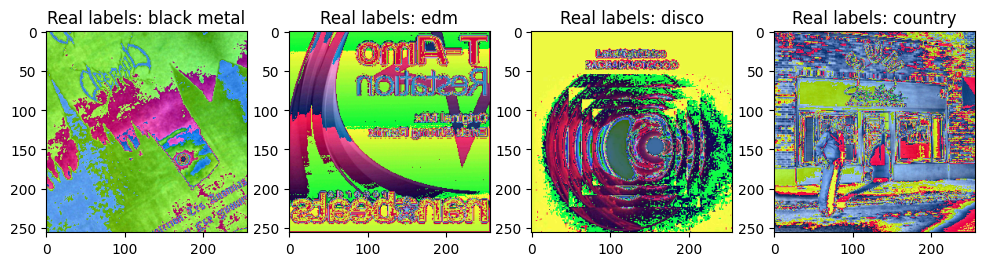

In [110]:
trainset, trainloader, testset, testloader, classes = load_dataset()

images, labels = next(iter(trainloader))
image_shower(images, labels)

<span style="color: blue;"> Код обучения лучшей модели CV.</span>

In [111]:
# %%time 
# weights = ResNet50_Weights.IMAGENET1K_V2
# model = models.resnet50(weights=weights)

# # Number of classes
# num_classes = 10

# # Замораживаем параметры модели, чтобы обучать только последний полносвязанный слой
# for param in model.parameters():
#     param.requires_grad = False

# # Modify the final fully connected layer according to the number of classes
# num_features = model.fc.in_features
# model.fc = nn.Linear(num_features, num_classes)

# optimizer = optim.Adam(model.parameters(), lr=0.0001,  weight_decay = 0)

# model_baseline = start_learning(model, optimizer, 'test_up', num_epochs = 100, save_interval = 20)

In [112]:
# pred, true = pred_model(model_baseline, testloader)

In [113]:
# f1_score(pred, true, average =  'micro')

<span style="color: blue;"> Результат f1 лучшей модели CV равняется 0.635 (на тесте) </span>

<div style="background-color: lightgreen; padding: 10px;">
Вывод: были проведи исследования по поиску лучшей модели, которая сможет преодолеть результата baseline. На данный момент все модели показали результат хуже. Была обучена нейронная сеть, которая смогла показать на тесте f1 0.635, но модель обучалась на тестовой выборке, что ставит её в другие рамки, т.к. она подгонялась под тест. Но на текущий момент это явно лучший результат, поэтому воспользуемся ей.
</div>

# 6. Тестирование лучшей модели

In [114]:
model_path = 'test_up_resnet50_final_model_epochs_100.pth'
weights = ResNet50_Weights.IMAGENET1K_V2
model = models.resnet50(weights=weights)

for param in model.parameters():
    param.requires_grad = False
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 10)
    
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
# model

<All keys matched successfully>

In [115]:
pred, true = pred_model(model, testloader)

cpu


In [116]:
f1_score(pred, true, average =  'micro')

0.6358974358974359

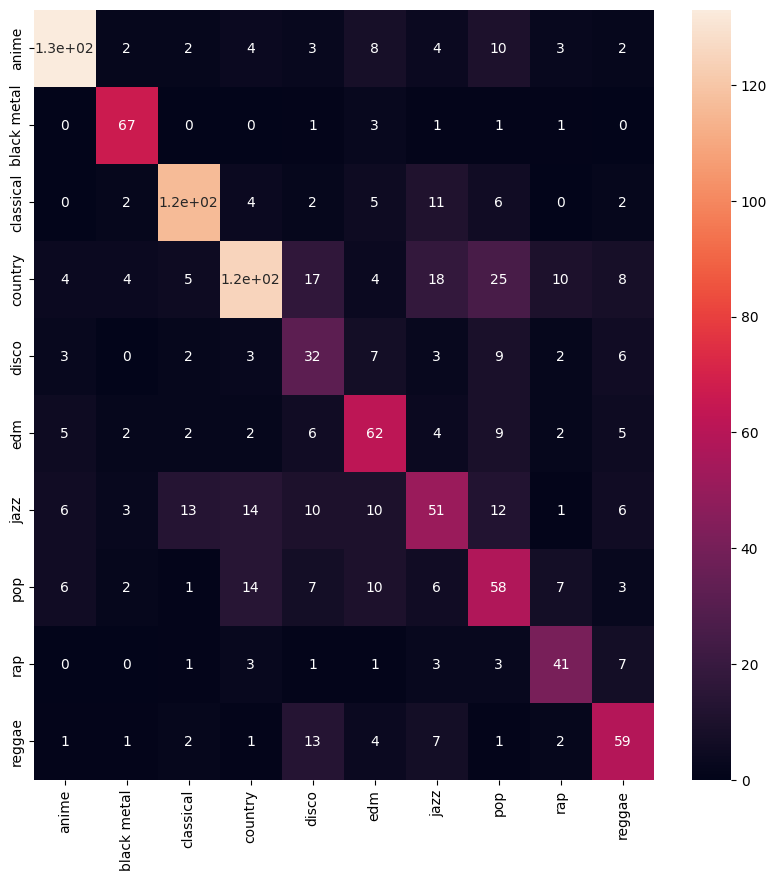

In [117]:
confusion_matrix_df = pd.DataFrame(confusion_matrix(true, pred)).rename(columns=idx2class, index=idx2class)

plt.figure(figsize = (10,10))
sns.heatmap(confusion_matrix_df, annot=True)
plt.show()

# Итог

>В ходе работы были выполнены следующие операции:
>- Сформирован датасет
>- Исследованы все изображения датасета
>- Сформированы выборки для обучения различных моделей
>- Сформированы baseline'ы разных решений
>- Проведены попытки улучшения базовых моделей
>- Проведелно финальное тестирование лучшей модели


> В ходе исследования была изучена информация о имеющихся данных для обучения. Были сформированы и трансформированы датасеты для различных моделей . Выбраны основные метрики, на которых основывалось обучения моделей (f1 и accuracy). В ходе исследования лучший результат был у baseline Catboost. Так же удалось обучить нейросеть CV используя модель ResNet50. Модель обучалась на train и test, из-за чего модель подогнолась под тестовую выборку. Но на текущий момент это лучший из вариантов по метрике f1 = 0.635